# TELEPHOS: towards end-to-end learning for prosthetic vision

### Notebook for reporting progress 

Version: May04 \
Datasets: ADE20K and characters (generic)\
Latest modification: Full run with irregular phosphenes


#### 0. Import statements and utilities

In [1]:
## Import statements

# Local dependencies
import model
import utils
import local_datasets
import training
import evaluation

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import Dataset, DataLoader 

# Other
import os
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
import seaborn as sns

import local_datasets

### 1. Training

In [2]:
training_protocol = pd.read_csv('training_configuration/config_may04.csv').replace({'None':None,'True':True,'False':False,np.nan:None})
todo = None

# # exp 1,2 or 4 - Training
# for i,cfg in todo.iterrows():
#     models, dataset, optimization, train_settings = training.initialize_components(cfg)
#     print(cfg)
#     training.train(models, dataset, optimization, train_settings, visualize=True)

# # exp 4b - Only train decoding with CED of HED-based phosphene encodings:
# for i,cfg in todo.iterrows():
#     models, dataset, optimization, train_settings = training.initialize_components(cfg)
#     models['encoder'] = model.Intensity_Encoder().to(cfg.device)
#     models['simulator'] = model.E2E_PhospheneSimulator(pMask=models['simulator'].pMask.clone().to(cfg.device),
#                                                                scale_factor=2,
#                                                                sigma=1.5,
#                                                                intensity=10,
#                                                                device=cfg.device).to(cfg.device)
#     img_kind = 'hed' if cfg.condition.endswith('hed') else 'ced'
#     trg_kind = 'lbl' if cfg.condition.startswith('b') else 'img' #boundary vs image reconstr.
#     trainset = local_datasets.HED_Dataset(device=cfg.device,img_kind=img_kind,trg_kind=trg_kind)
#     valset = local_datasets.HED_Dataset(device=cfg.device,img_kind=img_kind,trg_kind=trg_kind, validation=True)
#     dataset['trainloader'] = DataLoader(trainset,batch_size=int(cfg.batch_size),shuffle=True)
#     dataset['valloader'] = DataLoader(valset,batch_size=min([len(valset),100]),shuffle=False)
#     dataset['trainset'] = trainset
#     dataset['valset'] = valset
#     optimization['lossfunc'].target = 'label'
    
#     # TRAIN
#     print(cfg)
#     training.train(models, dataset, optimization, train_settings, visualize=True)

### 2. Evaluation

#### Experiment 1

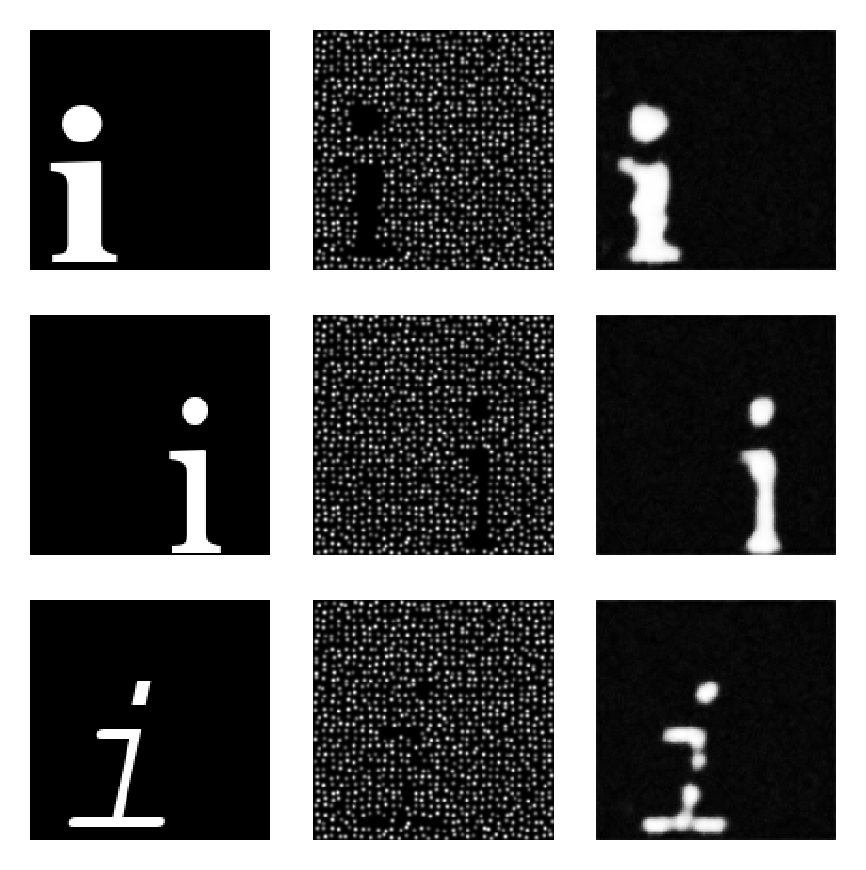

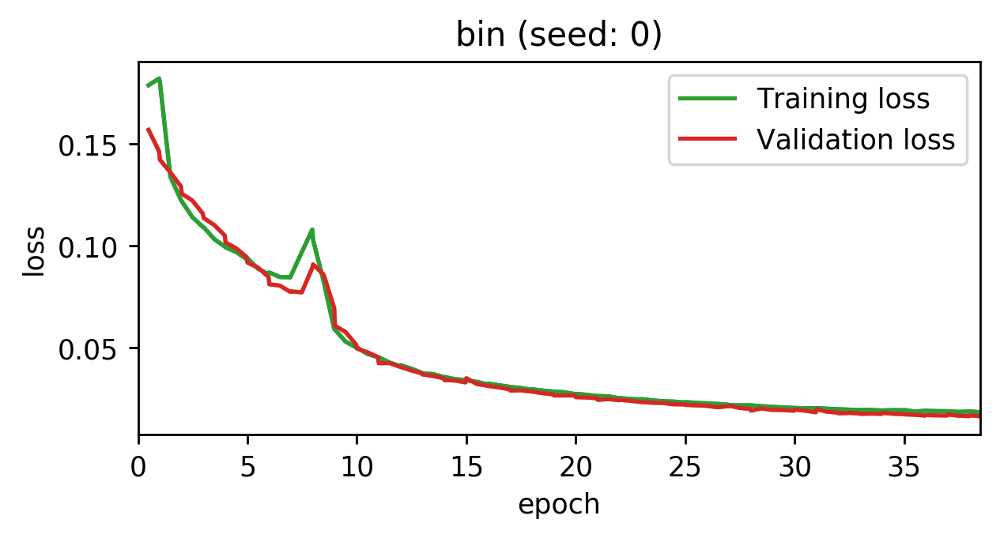

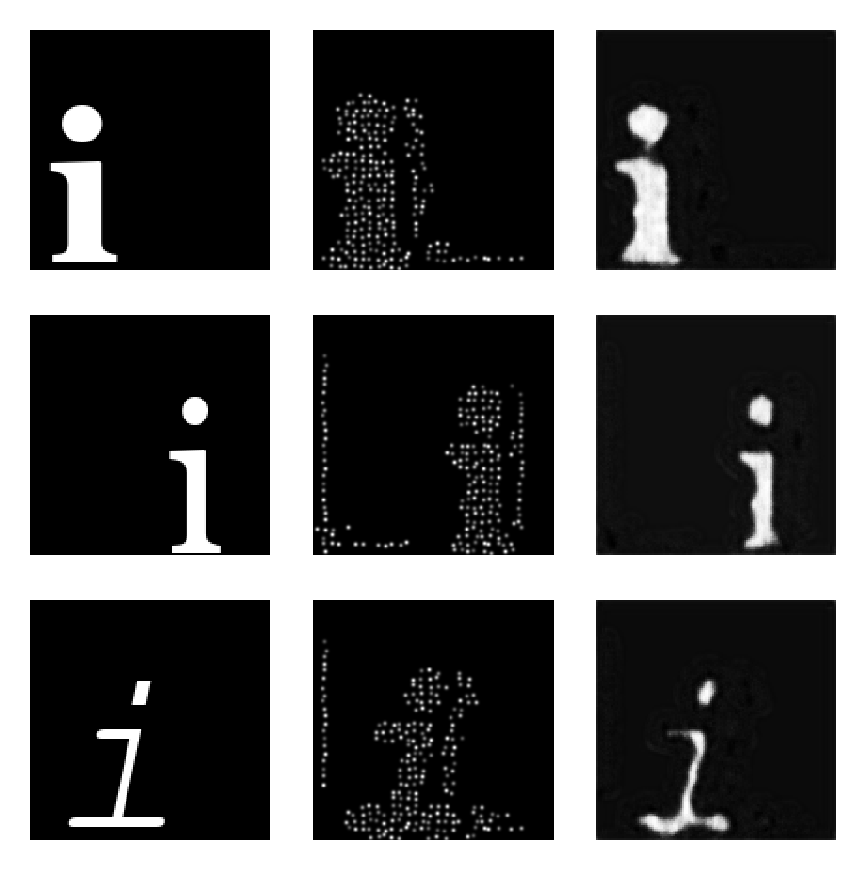

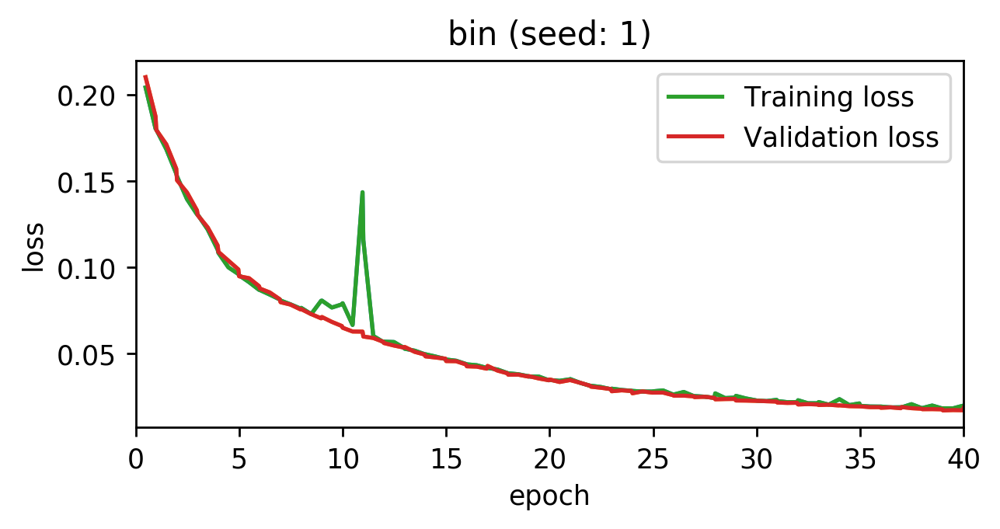

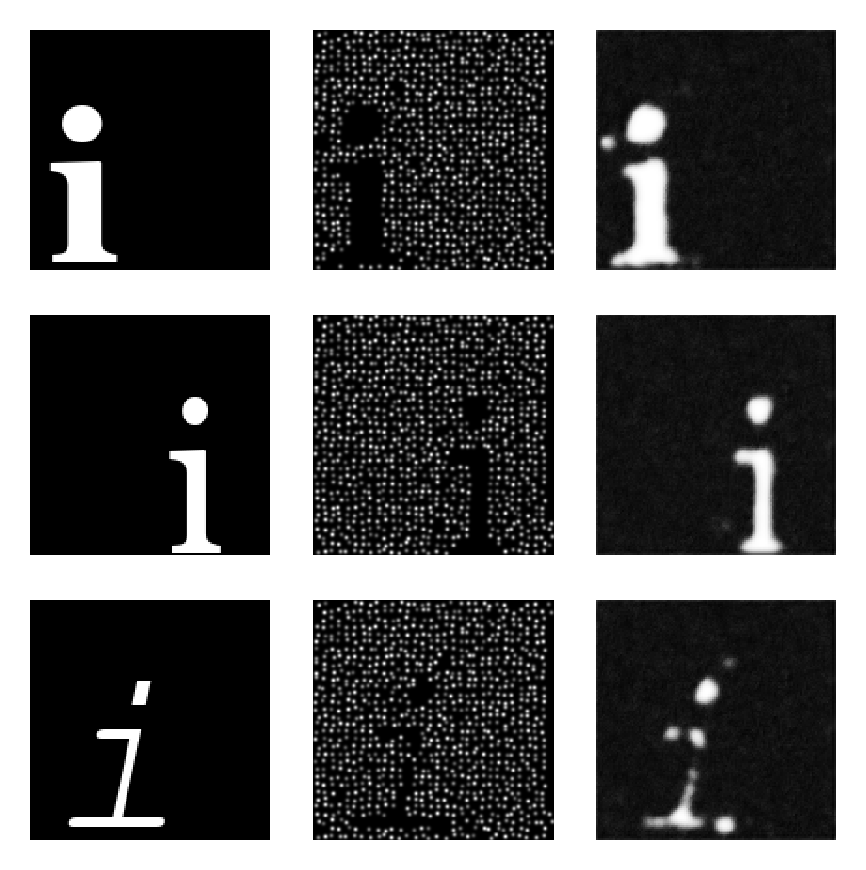

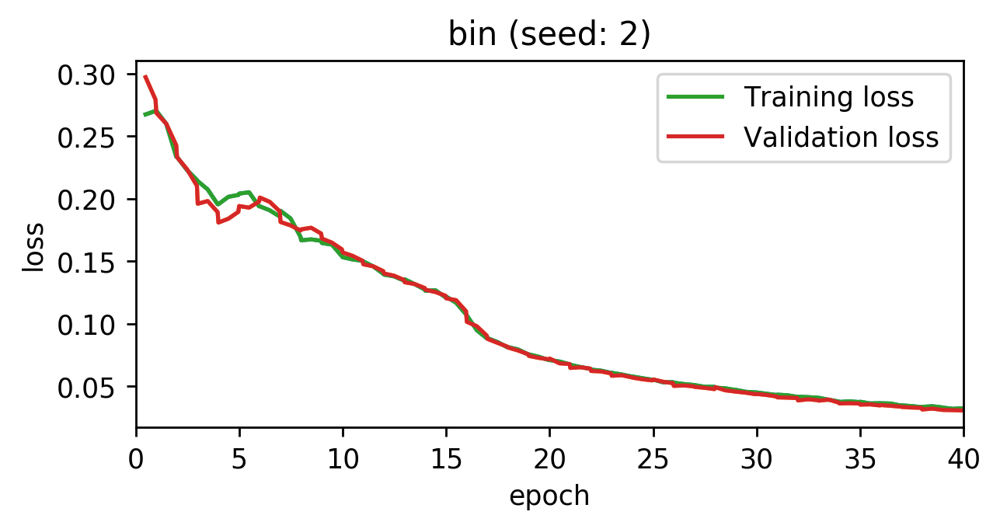

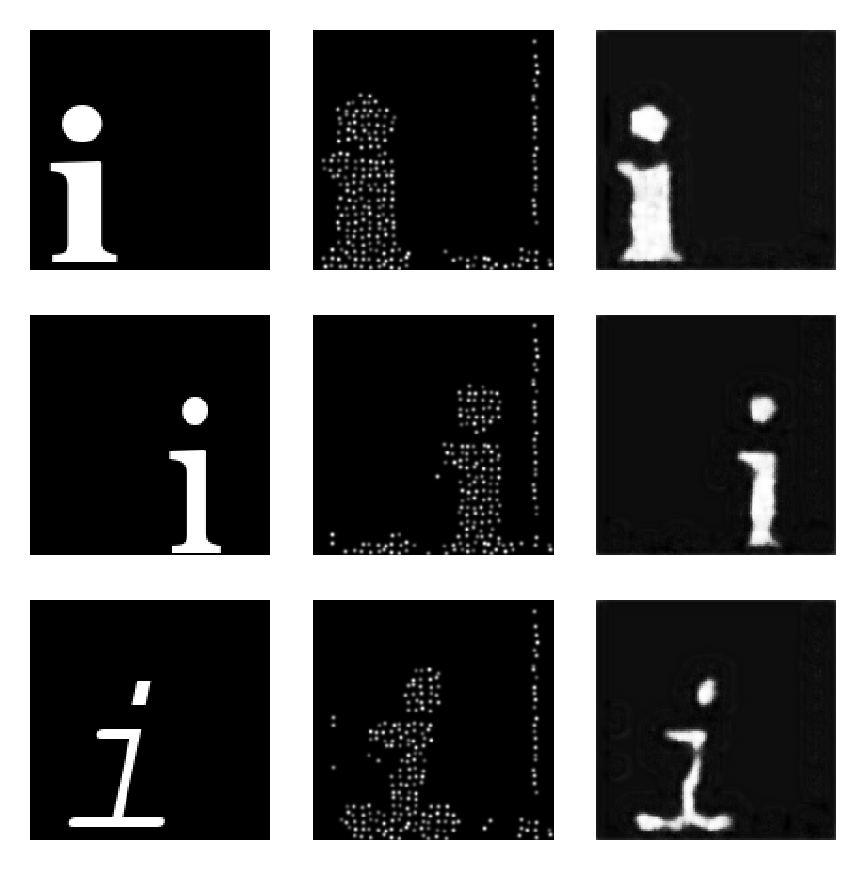

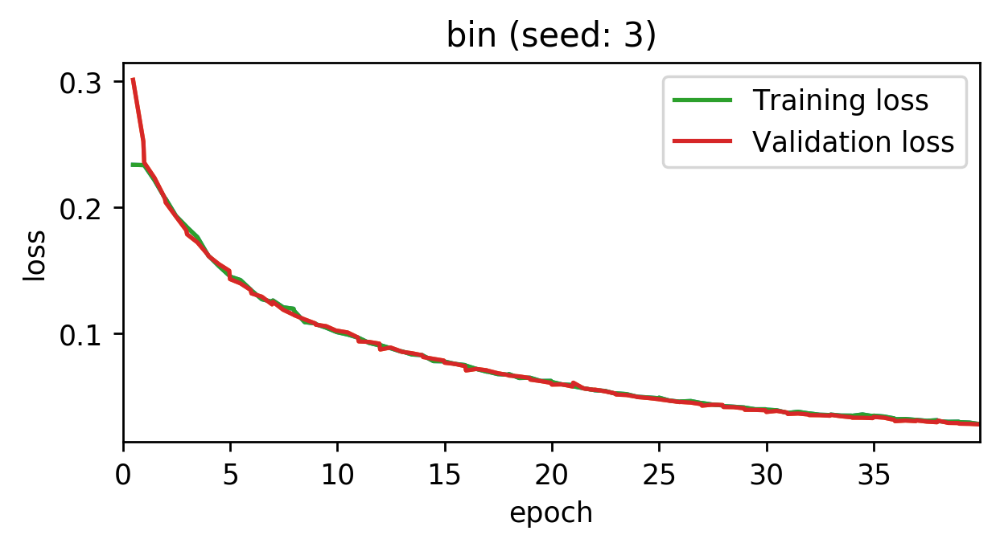

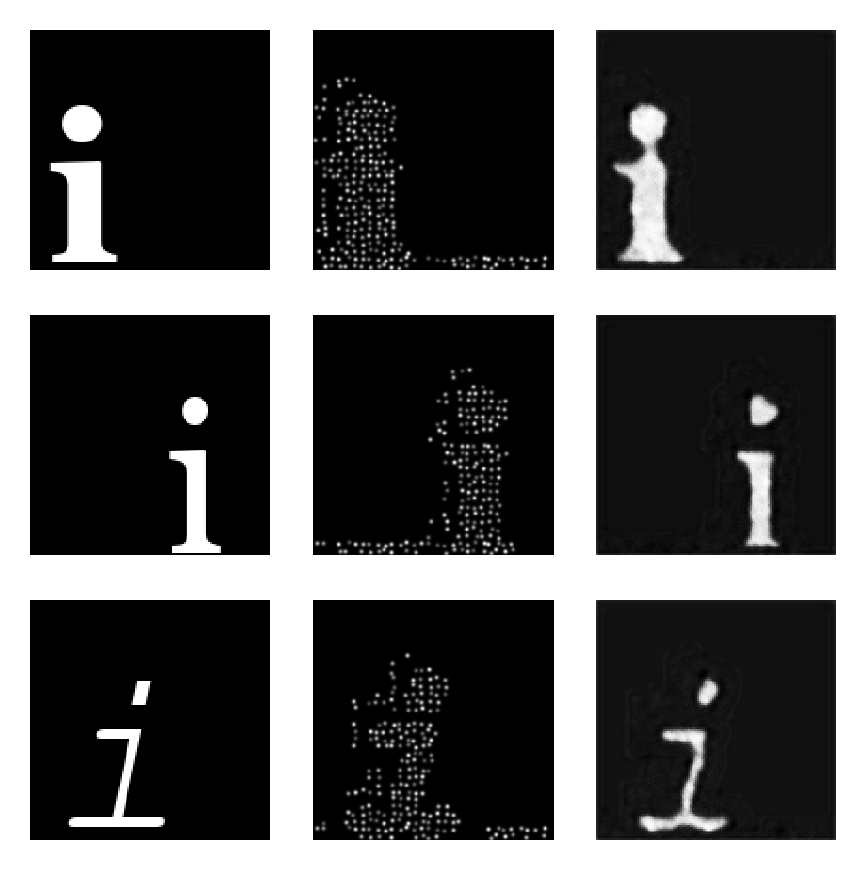

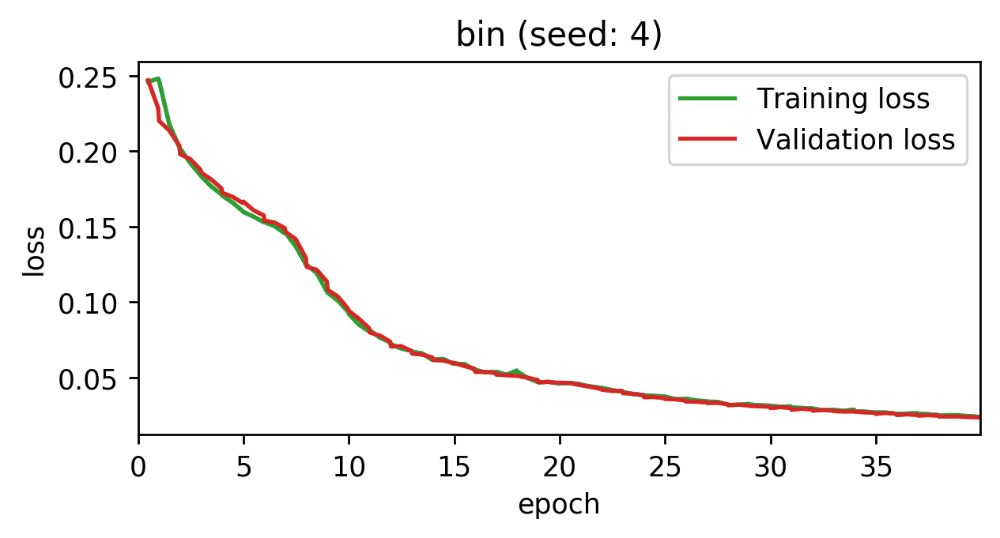

In [21]:
training_protocol = pd.read_csv('training_configuration/config_may04.csv').replace({'None':None,'True':True,'False':False,np.nan:None})

protocol = training_protocol.loc[training_protocol.experiment=='exp1']

id_vars=['savedir','experiment','model_name','condition','seed','learning_rate','kappa','reconstruction_loss_param']
dep_vars = ['epoch','val_total_loss', 'perc_active', 'mse', 'ssim','psnr']
results = pd.DataFrame(columns=id_vars+dep_vars)
train_stats ={} #dict with all train stats

for i, (_,cfg) in enumerate(protocol.iterrows()):
    results=results.append(cfg.loc[id_vars], ignore_index=True)
    stats, best_result = evaluation.read_train_stats(os.path.join(cfg.savedir,cfg.model_name+'_train_stats.csv'))
    train_stats[cfg.model_name] = stats
    results.loc[i,dep_vars] = best_result.reindex(dep_vars)
    metrics = evaluation.evaluate_saved_model(cfg,visualize=[73,74,75])
    results.loc[i,dep_vars] = results.loc[i,dep_vars].combine_first(metrics)
    
    

    
    # Plot training curves
    plt.figure(figsize=(5.5,2.5),dpi=250)
    g = sns.lineplot(data=stats,x='epoch',y='value',hue='variable')
    handles, labels = g.get_legend_handles_labels()
    g.legend(handles=handles[3:], labels=['Training loss', 'Validation loss'])
    plt.ylabel('loss')
    plt.title('%s (seed: %d)' %(cfg.condition,cfg.seed))
    plt.xlim([0,best_result.epoch])
    plt.show()



In [26]:
results = results.sort_values(['experiment','condition','val_total_loss'])
# results.to_csv('./out/may04/Results/results_exp1.csv', index=False)
results

,savedir,experiment,model_name,condition,seed,learning_rate,kappa,reconstruction_loss_param,epoch,val_total_loss,perc_active,mse,ssim,psnr
1,./out/may04/exp1,exp1,exp1_bin_S1,bin,1,0.00001,0.0,0.0,40.000000,0.018095,24.804688,0.018246,0.134066,17.462984
0,./out/may04/exp1,exp1,exp1_bin_S0,bin,0,0.00001,0.0,0.0,38.480769,0.018284,95.651376,0.018051,0.139089,17.599234
4,./out/may04/exp1,exp1,exp1_bin_S4,bin,4,0.00001,0.0,0.0,39.961538,0.023757,25.125200,0.023961,0.114960,16.259922
3,./out/may04/exp1,exp1,exp1_bin_S3,bin,3,0.00001,0.0,0.0,39.961538,0.028016,24.217915,0.028201,0.110770,15.531768
2,./out/may04/exp1,exp1,exp1_bin_S2,bin,2,0.00001,0.0,0.0,40.000000,0.031791,88.202791,0.031828,0.100081,15.005520


In [24]:
# # Convert figures to GIF 
# import imageio
# for s in ['S0','S1','S2','S3','S4',]:
#     images = sorted([fn for fn in os.listdir(cfg.savedir+'/figures') if s in fn])
#     # images = [fn for fn in images if len(fn)==25]+[fn for fn in images if len(fn)==26]
#     images = [imageio.imread(cfg.savedir+'/figures/'+fn) for fn in images]
#     imageio.mimsave(cfg.savedir+'/figures/_{}_gif.gif'.format(s), images)

#### Experiment 2

In [7]:
import evaluation

# Read the saved training statistics
protocol = training_protocol.loc[(training_protocol.experiment=='exp2')]


id_vars=['savedir','experiment','model_name','condition','seed','learning_rate','kappa','reconstruction_loss_param']
dep_vars = ['epoch','val_total_loss', 'perc_active', 'mse', 'fsim', 'ssim','psnr', 'accuracy','sensitivity','specificity','precision']
results = pd.DataFrame(columns=id_vars+dep_vars)
train_stats ={} #dict with all train stats

for i, (_,cfg) in enumerate(protocol.iterrows()):
    print(cfg.model_name)
    results=results.append(cfg.loc[id_vars], ignore_index=True)
    stats, best_result = evaluation.read_train_stats(os.path.join(cfg.savedir,cfg.model_name+'_train_stats.csv'))
    train_stats[cfg.model_name] = stats
    results.loc[i,dep_vars] = best_result.reindex(dep_vars)
    metrics = evaluation.evaluate_saved_model(cfg,)#visualize=3)
    results.loc[i,dep_vars] = results.loc[i,dep_vars].combine_first(metrics)


exp2_K0_S0
exp2_K1_S0
exp2_K2_S0
exp2_K3_S0
exp2_K4_S0
exp2_K5_S0
exp2_K6_S0
exp2_K7_S0
exp2_K8_S0
exp2_K9_S0
exp2_K10_S0
exp2_K11_S0
exp2_K12_S0
exp2_K0_S1
exp2_K1_S1
exp2_K2_S1
exp2_K3_S1
exp2_K4_S1
exp2_K5_S1
exp2_K6_S1
exp2_K7_S1
exp2_K8_S1
exp2_K9_S1
exp2_K10_S1
exp2_K11_S1
exp2_K12_S1
exp2_K0_S2
exp2_K1_S2
exp2_K2_S2
exp2_K3_S2
exp2_K4_S2
exp2_K5_S2
exp2_K6_S2
exp2_K7_S2
exp2_K8_S2
exp2_K9_S2
exp2_K10_S2
exp2_K11_S2
exp2_K12_S2
exp2_K0_S3
exp2_K1_S3
exp2_K2_S3
exp2_K3_S3
exp2_K4_S3
exp2_K5_S3
exp2_K6_S3
exp2_K7_S3
exp2_K8_S3
exp2_K9_S3
exp2_K10_S3
exp2_K11_S3
exp2_K12_S3
exp2_K0_S4
exp2_K1_S4
exp2_K2_S4
exp2_K3_S4
exp2_K4_S4
exp2_K5_S4
exp2_K6_S4
exp2_K7_S4
exp2_K8_S4
exp2_K9_S4
exp2_K10_S4
exp2_K11_S4
exp2_K12_S4


In [8]:
results = results.sort_values(['condition','val_total_loss'])
summary = pd.DataFrame()
for c in results.condition.unique():
    summary = summary.append(results[results.condition==c].head(1))
summary = summary.sort_values('kappa')
summary

,savedir,experiment,model_name,condition,seed,learning_rate,kappa,reconstruction_loss_param,epoch,val_total_loss,perc_active,mse,fsim,ssim,psnr,accuracy,sensitivity,specificity,precision
13,./out/may04/exp2,exp2,exp2_K0_S1,K0,1,0.0002,0.006693,0.0,10.909091,0.015471,27.128405,0.013844,0.873200,0.247560,18.823034,NaN,NaN,NaN,NaN
14,./out/may04/exp2,exp2,exp2_K1_S1,K1,1,0.0002,0.015267,0.0,12.000000,0.016736,27.473958,0.012909,0.875220,0.273367,19.099444,NaN,NaN,NaN,NaN
15,./out/may04/exp2,exp2,exp2_K2_S1,K2,1,0.0002,0.034445,0.0,15.000000,0.019275,16.846955,0.012335,0.877012,0.360434,19.308809,NaN,NaN,NaN,NaN
16,./out/may04/exp2,exp2,exp2_K3_S1,K3,1,0.0002,0.075858,0.0,29.000000,0.021243,19.577157,0.011817,0.868890,0.656339,19.523025,NaN,NaN,NaN,NaN
4,./out/may04/exp2,exp2,exp2_K4_S0,K4,0,0.0002,0.158869,0.0,16.000000,0.027991,15.261502,0.011098,0.875439,0.623835,19.832052,NaN,NaN,NaN,NaN
5,./out/may04/exp2,exp2,exp2_K5_S0,K5,0,0.0002,0.302941,0.0,26.000000,0.037184,13.905582,0.010375,0.891833,0.374078,20.063432,NaN,NaN,NaN,NaN
19,./out/may04/exp2,exp2,exp2_K6_S1,K6,1,0.0002,0.500000,0.0,18.909091,0.051812,10.107839,0.012187,0.862471,0.673192,19.391364,NaN,NaN,NaN,NaN
59,./out/may04/exp2,exp2,exp2_K7_S4,K7,4,0.0002,0.697059,0.0,35.000000,0.054610,9.187617,0.011152,0.860667,0.804093,19.752083,NaN,NaN,NaN,NaN
60,./out/may04/exp2,exp2,exp2_K8_S4,K8,4,0.0002,0.841131,0.0,53.000000,0.047758,5.488782,0.010896,0.880240,0.824122,19.874893,NaN,NaN,NaN,NaN
9,./out/may04/exp2,exp2,exp2_K9_S0,K9,0,0.0002,0.924142,0.0,29.909091,0.042664,2.787376,0.020848,0.817534,0.676653,17.072678,NaN,NaN,NaN,NaN


exp2_K0_S1
0.006692830924284856


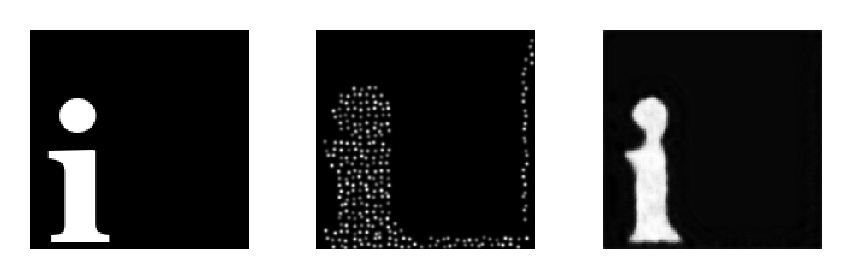

perc_active    27.128405
mse             0.013844
ssim            0.247560
fsim            0.873200
psnr           18.823034
dtype: float64


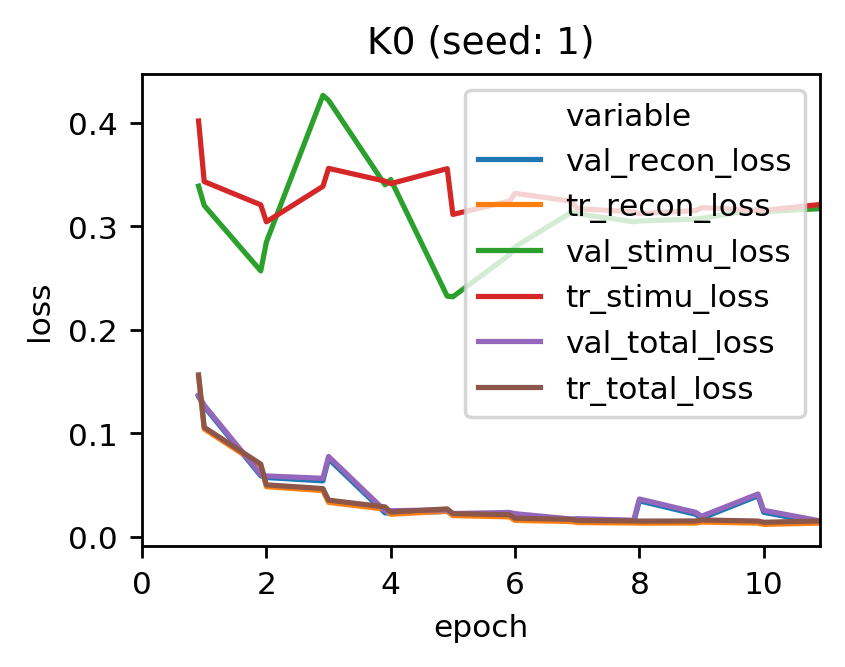

exp2_K1_S1
0.015267153880374444


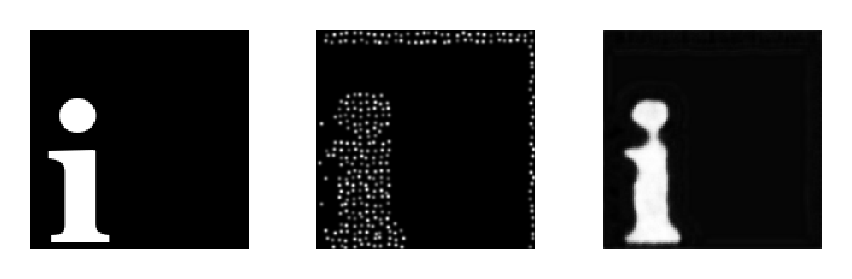

perc_active    27.473958
mse             0.012909
ssim            0.273367
fsim            0.875220
psnr           19.099444
dtype: float64


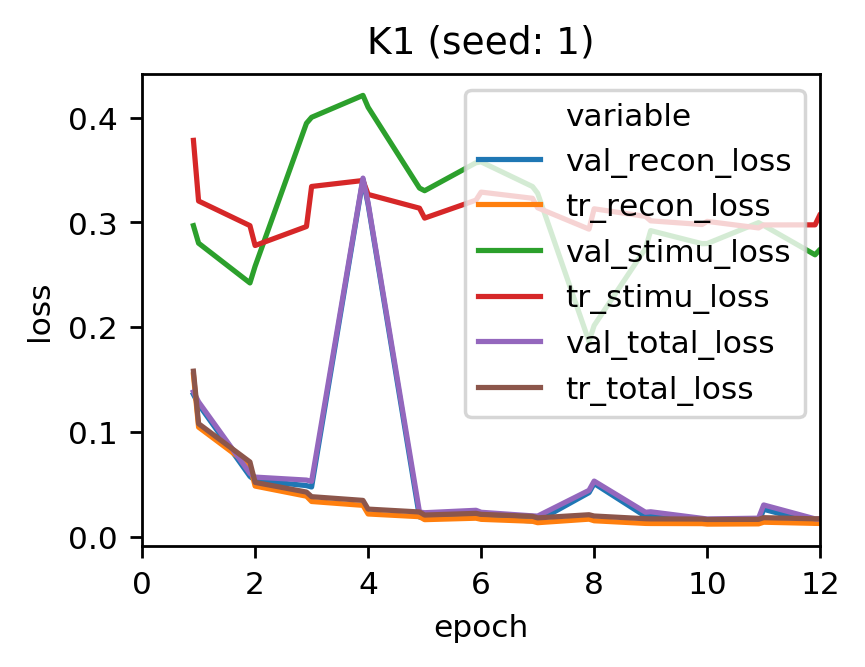

exp2_K2_S1
0.03444519566621118


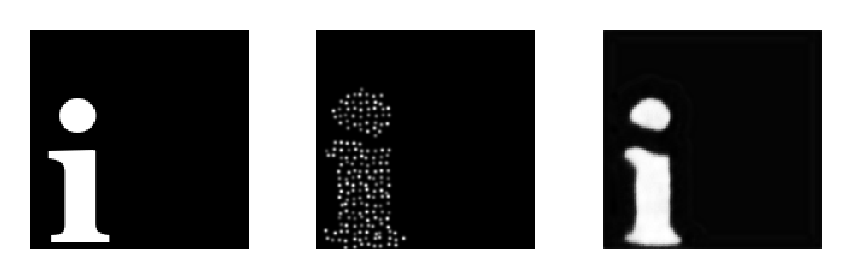

perc_active    16.846955
mse             0.012335
ssim            0.360434
fsim            0.877012
psnr           19.308809
dtype: float64


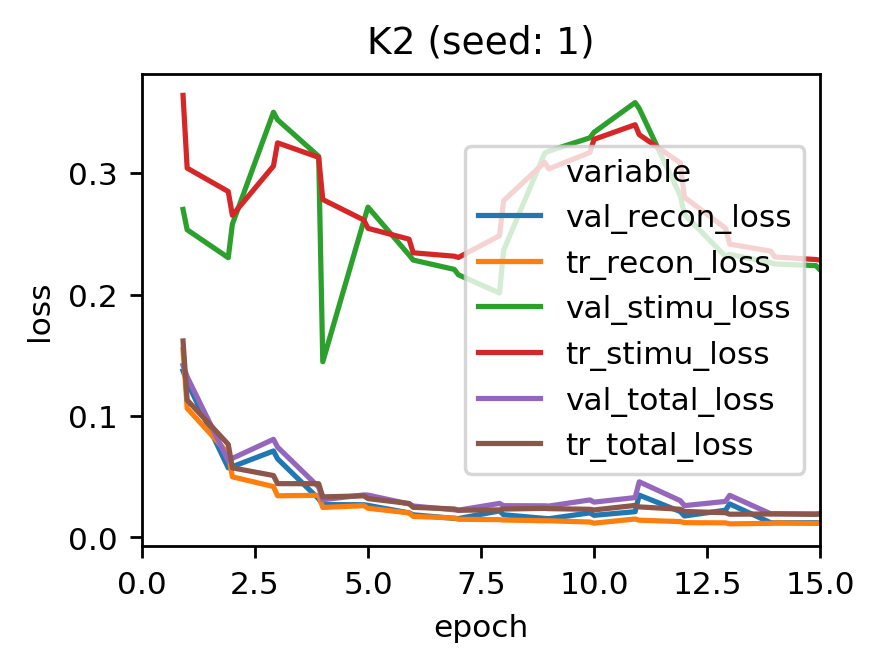

exp2_K3_S1
0.07585818002124355


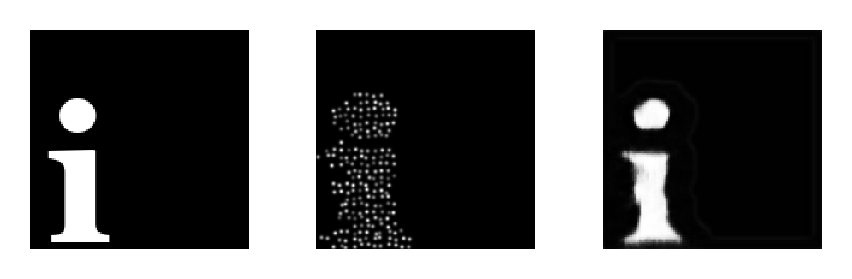

perc_active    19.577157
mse             0.011817
ssim            0.656339
fsim            0.868890
psnr           19.523025
dtype: float64


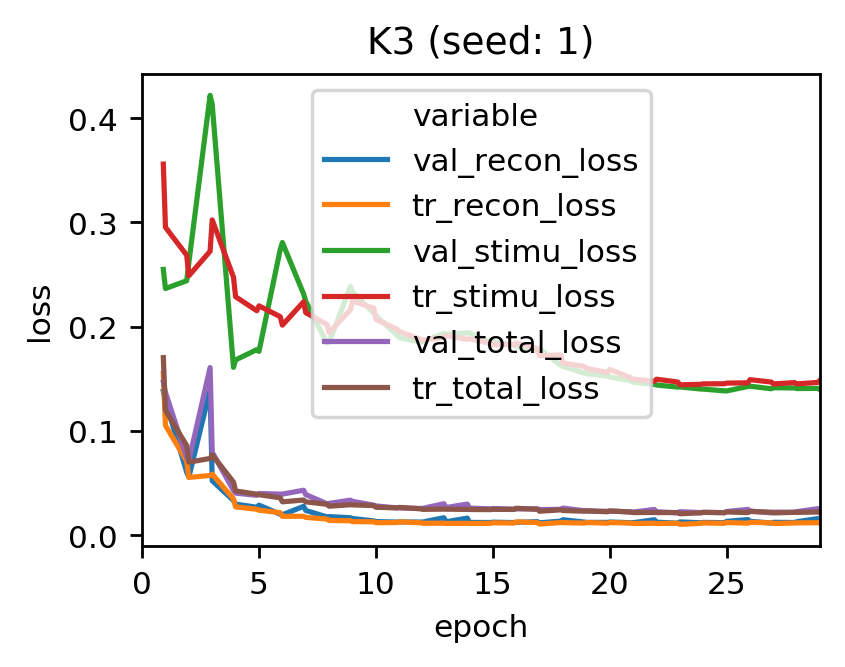

exp2_K4_S0
0.15886910488091516


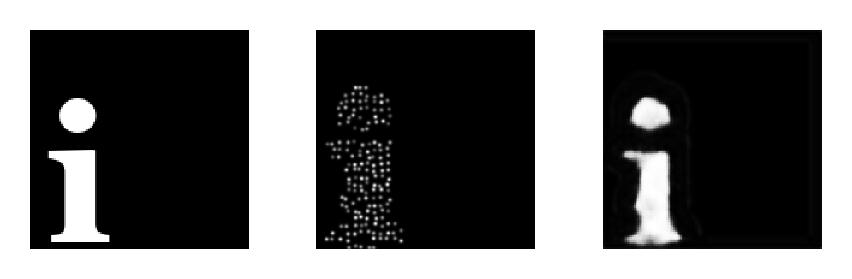

perc_active    15.261502
mse             0.011098
ssim            0.623835
fsim            0.875439
psnr           19.832052
dtype: float64


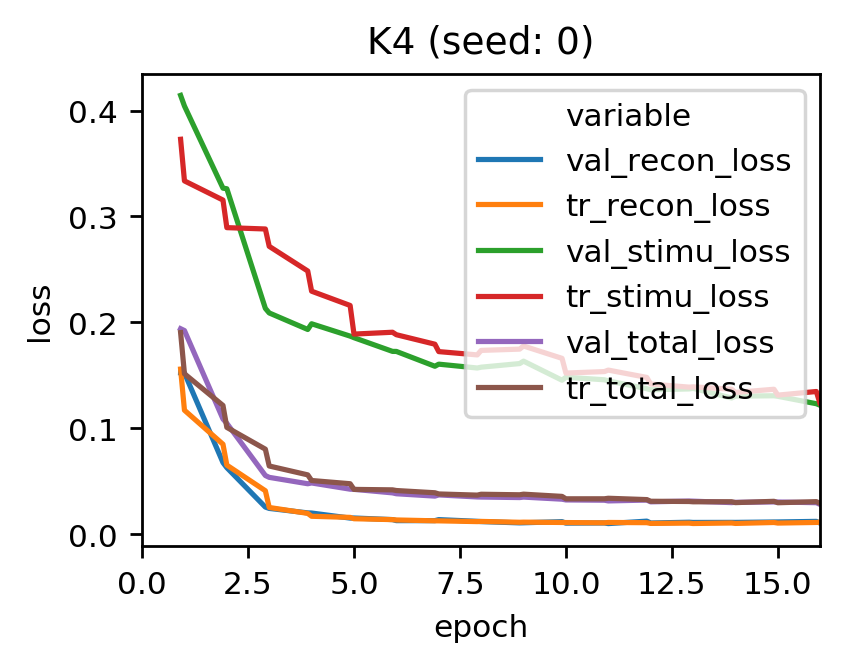

exp2_K5_S0
0.3029407160345928


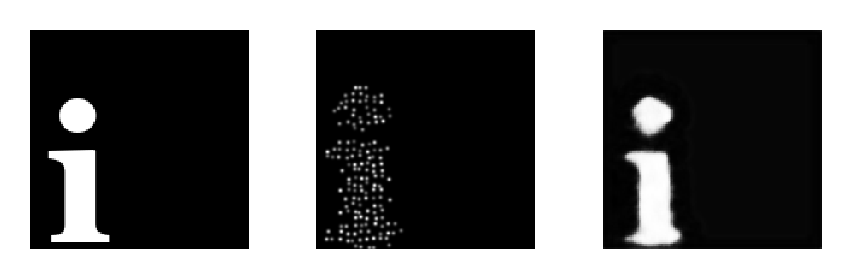

perc_active    13.905582
mse             0.010375
ssim            0.374078
fsim            0.891833
psnr           20.063432
dtype: float64


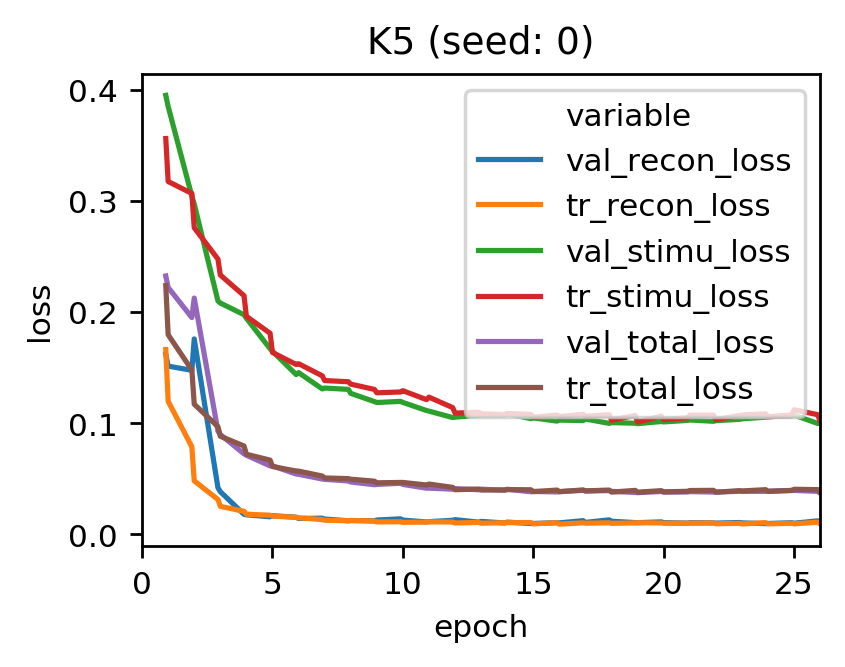

exp2_K6_S1
0.5


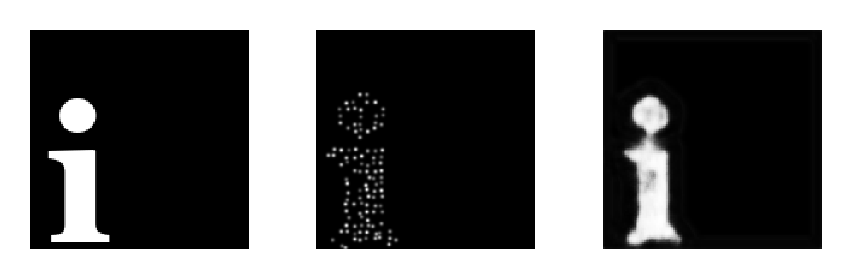

perc_active    10.107839
mse             0.012187
ssim            0.673192
fsim            0.862471
psnr           19.391364
dtype: float64


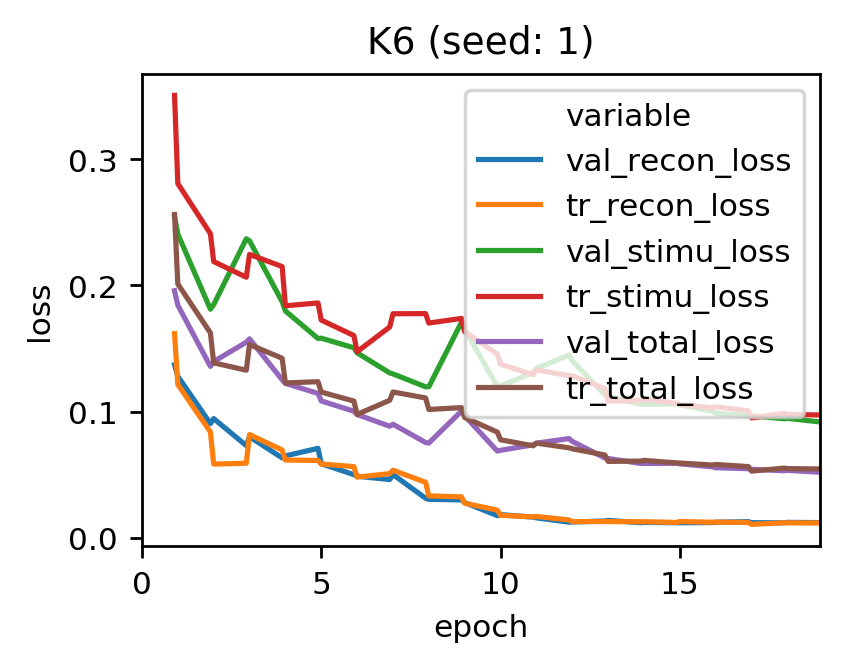

exp2_K7_S4
0.6970592839654074


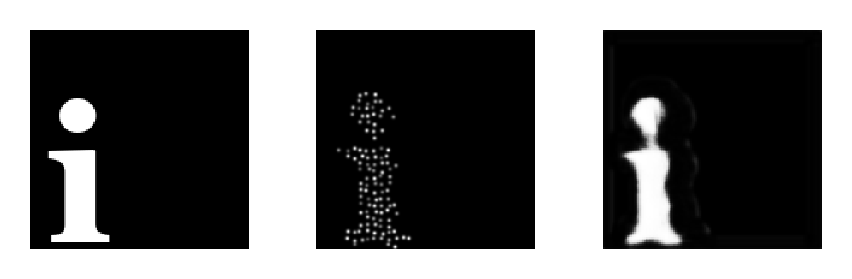

perc_active     9.187617
mse             0.011152
ssim            0.804093
fsim            0.860667
psnr           19.752083
dtype: float64


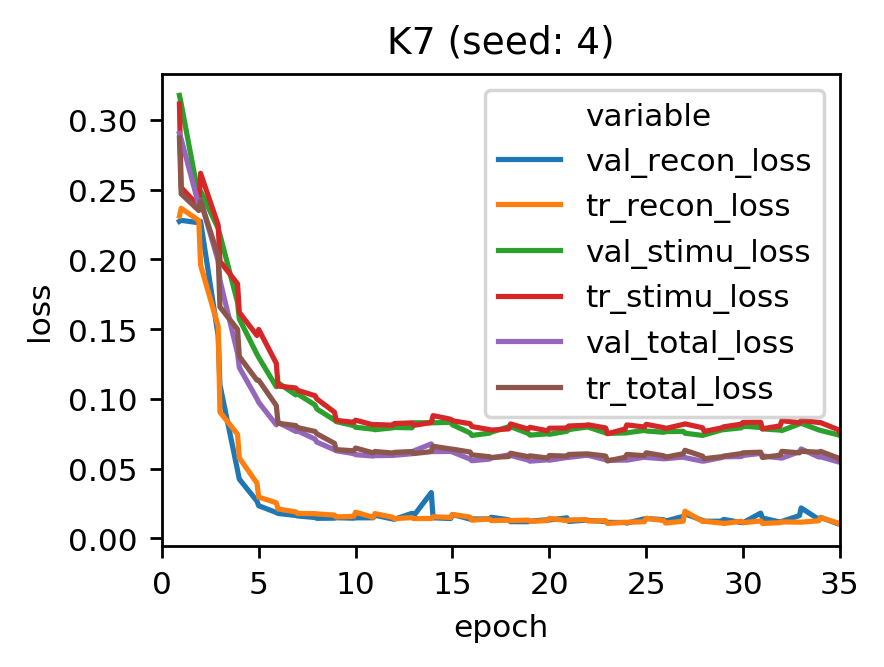

exp2_K8_S4
0.8411308951190849


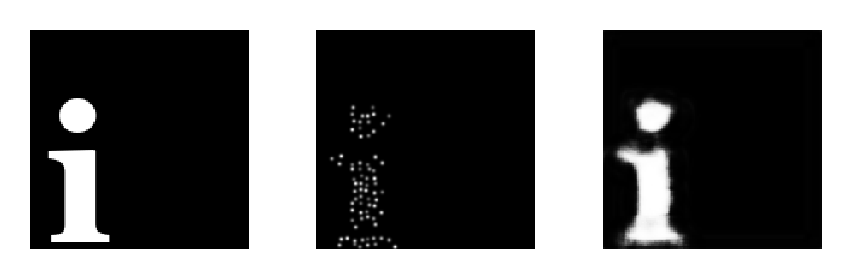

perc_active     5.488782
mse             0.010896
ssim            0.824122
fsim            0.880240
psnr           19.874893
dtype: float64


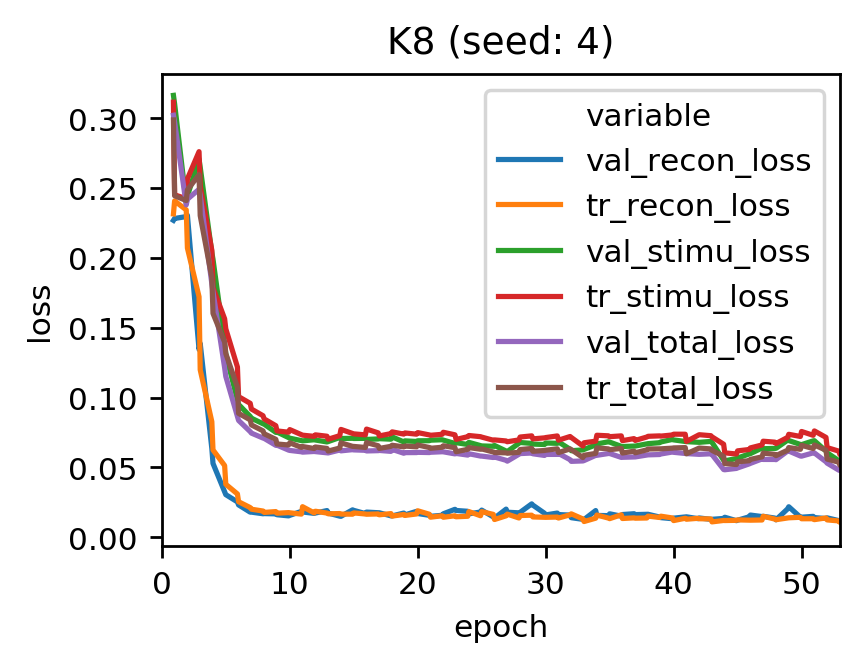

exp2_K9_S0
0.9241418199787566


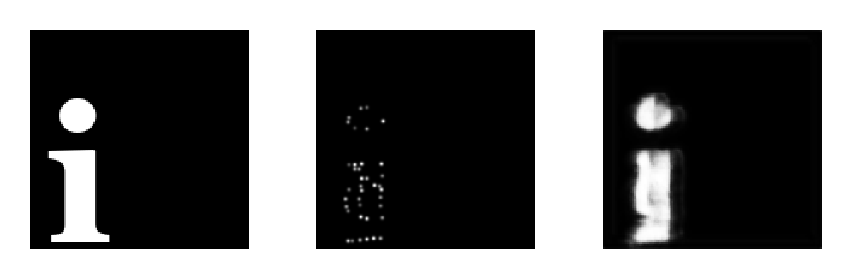

perc_active     2.787376
mse             0.020848
ssim            0.676653
fsim            0.817534
psnr           17.072678
dtype: float64


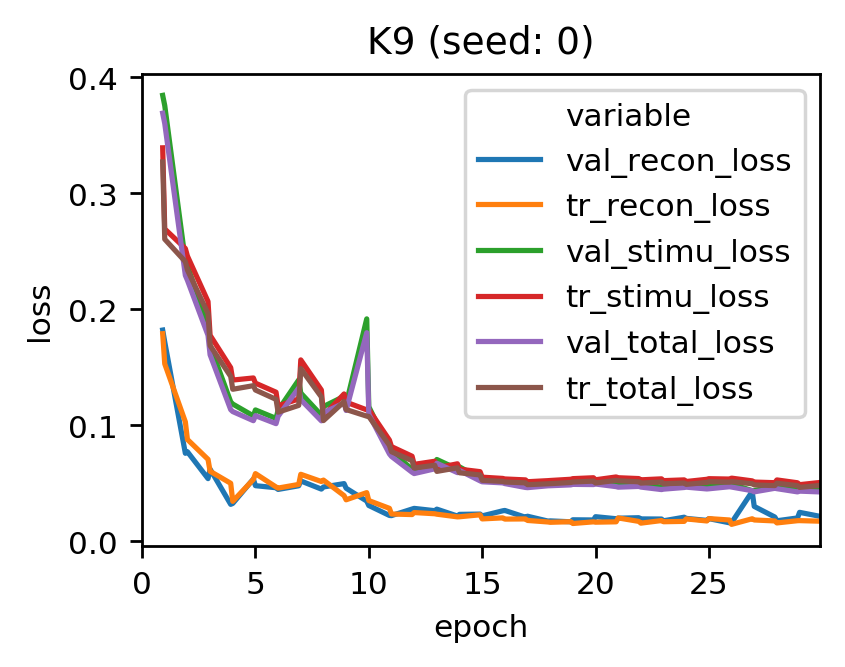

exp2_K10_S0
0.9655548043337888


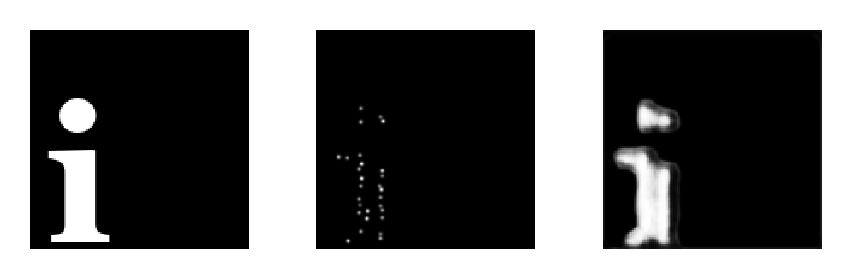

perc_active     1.998614
mse             0.027665
ssim            0.845990
fsim            0.763383
psnr           15.906675
dtype: float64


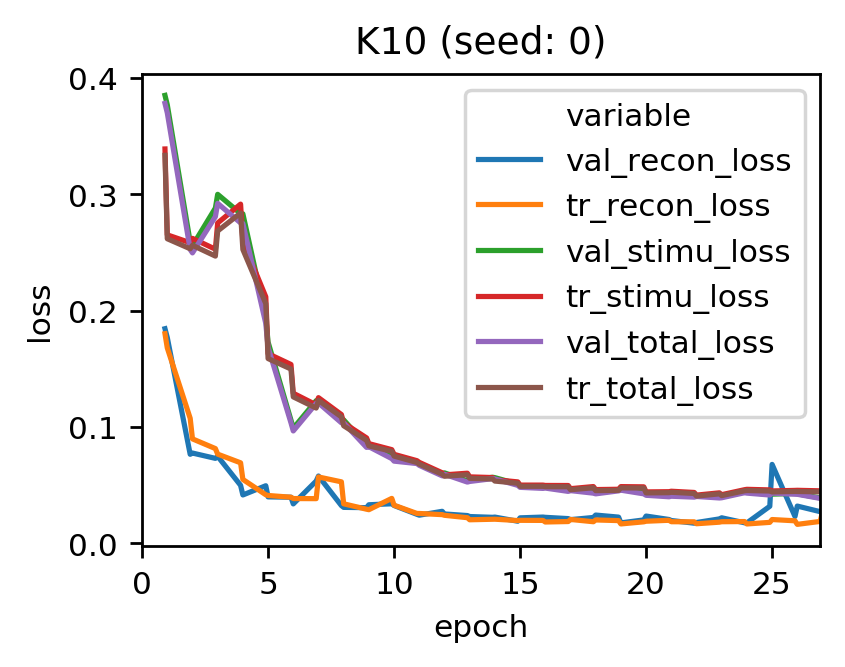

exp2_K11_S0
0.9847328461196256


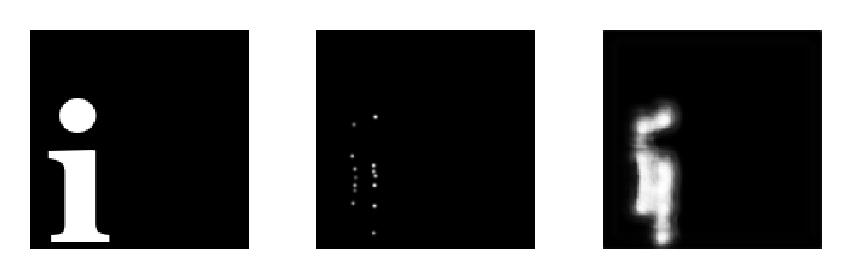

perc_active     1.111362
mse             0.031772
ssim            0.537766
fsim            0.772295
psnr           15.333172
dtype: float64


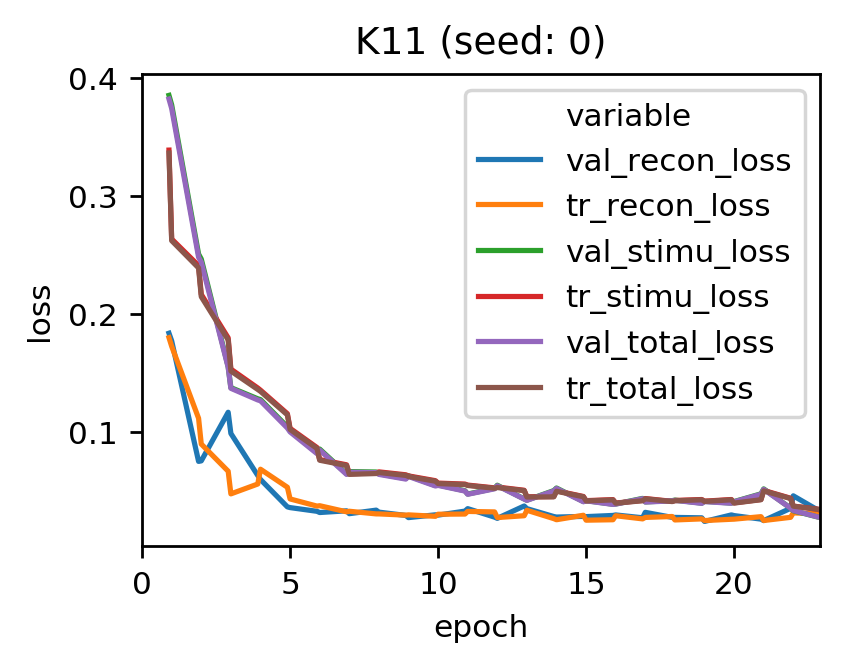

exp2_K12_S0
0.9933071490757152


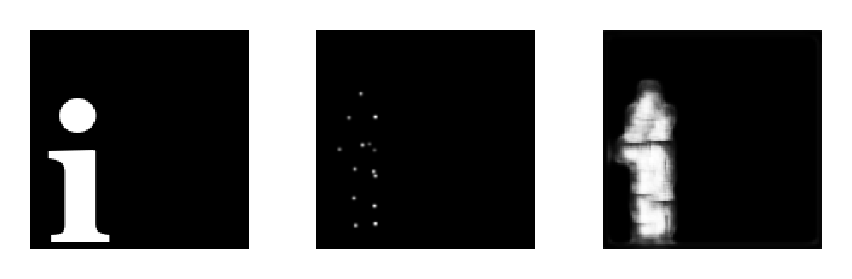

perc_active     1.226963
mse             0.026261
ssim            0.811174
fsim            0.780184
psnr           16.071670
dtype: float64


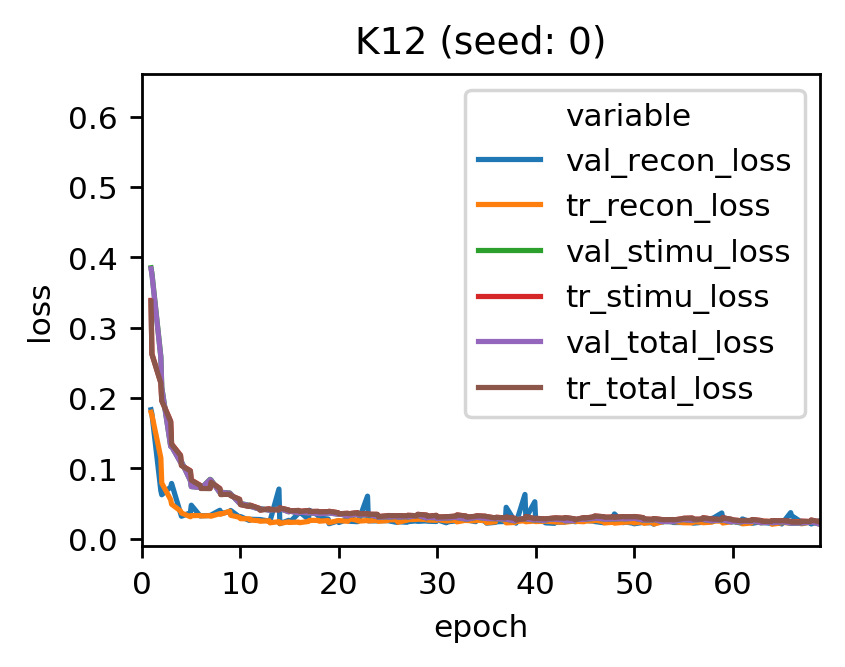

In [9]:
for _, model in summary.iterrows():
    cfg = protocol.loc[protocol.model_name==model.model_name].squeeze()
    print(model.model_name)
    print(model.kappa)
    metrics = evaluation.evaluate_saved_model(cfg,visualize=[73])
    print(metrics)
    
    
    stats, best_result = evaluation.read_train_stats(os.path.join(cfg.savedir,cfg.model_name+'_train_stats.csv'))
    
    # Plot training curves
    plt.figure(figsize=(3.5,2.5),dpi=250)
    g = sns.lineplot(data=stats,x='epoch',y='value',hue='variable')
    handles, labels = g.get_legend_handles_labels()
#     g.legend(handles=handles[3:], labels=['Training loss', 'Validation loss'])
    plt.ylabel('loss')
    plt.title('%s (seed: %d)' %(cfg.condition,cfg.seed))
    plt.xlim([0,best_result.epoch])
    plt.show()

In [10]:
table = results# pd.DataFrame(zip(kappa,perct,mserr,tr_id),columns=['kappa','perc.','MSE', 'id'])
melted_table = pd.melt(table,id_vars=['kappa','condition','model_name'],value_vars=['perc_active','mse'])
grouped = table.groupby('condition').mean()
grouped_melted = pd.melt(grouped,id_vars=['kappa'],value_vars=['perc_active','mse'])
mt = melted_table

# Normalize for visualization
mt['normalized'] = mt['value']
scales = [1,1]
offsets = [0,0]
for i,variable in enumerate(['perc_active', 'mse']):
    mask = mt.variable == variable
    scales[i] = 100 / (mt[mask].value.max()-mt[mask].value.min())
    offsets[i] = -mt[mask].value.min()
    mt.loc[mask,'normalized'] = scales[i]*(mt[mask].value+offsets[i])





exp2_K2_S1
exp2_K6_S1
exp2_K10_S0


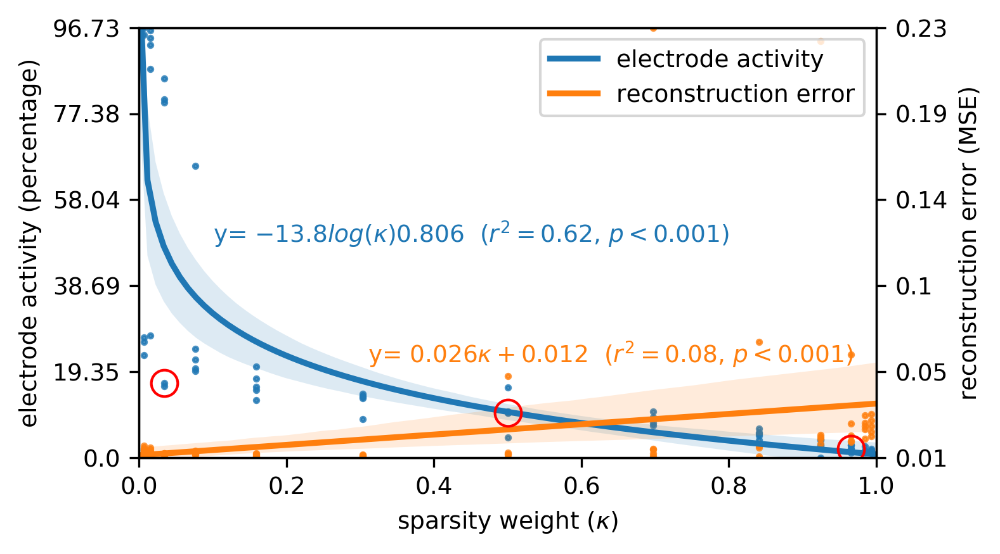

In [11]:
import matplotlib
from scipy import stats
matplotlib.rcParams.update({'font.size': 9})


percentage_active  = mt.loc[mt.variable=='perc_active',['kappa','value']].values
mean_squared_error = mt.loc[mt.variable=='mse',['kappa','value']].values

fig, ax1 = plt.subplots(figsize=(5,3),dpi=300)
g = sns.regplot(x='kappa', y='normalized',data=mt.loc[mt.variable=='perc_active'],
                ax=ax1, scatter=True, label='perc_active.',logx=True, scatter_kws={'s':3}, truncate=False)
g = sns.regplot(x='kappa', y='normalized',data=mt.loc[mt.variable=='mse'],
                ax=ax1, scatter=True, label='mse',logx=False, scatter_kws={'s':3}, truncate=False)





# Create first y-axis with scaled ticks
ax1.set_ylabel('electrode activity (percentage)')
ax1.set_ylim([0,100])
ax1.set_yticklabels(np.round((ax1.get_yticks()/scales[0])-offsets[0],2))



# Create a second y-axis with the scaled ticks
ax2 = ax1.twinx()
ax2.set_ylim([0,100])
ax2.set_yticklabels(np.round((ax2.get_yticks()/scales[1])-offsets[1],2))#,color = '#ff7f0e')
ax2.set_ylabel('reconstruction error (MSE)')#,color = '#ff7f0e')
# ax2.spines['left'].set_color('#1f77b4')
# ax2.spines['right'].set_color('#ff7f0e')

# # Show correct legend
# handles, labels = ax1.get_legend_handles_labels()
# ax1.legend(handles=handles[1:], labels=labels[1:])

slope,intercept,rvalue,pvalue,stderr = stats.linregress(np.log(percentage_active[:,0]),percentage_active[:,1])
ax1.text(.1, 50,'y= $%.1flog(\kappa)%.3f$  ($r^2=%.2f$, $p<0.001$)' %(slope,intercept,rvalue**2),
         fontsize=9,color='#1f77b4') #add text

slope,intercept,rvalue,pvalue,stderr = stats.linregress(mean_squared_error)
ax1.text(.31, 22,'y= $%.3f\kappa+%.3f$  ($r^2=%.2f$, $p<0.001$)' %(slope,intercept,rvalue**2),
         fontsize=9,color='#ff7f0e') #add text

ax1.legend(['electrode activity','reconstruction error'], loc='upper right')
# plt.show()
plt.xlim([0,1])
ax1.set_xlabel('sparsity weight ($\kappa$)')

for model_name in summary.model_name.iloc[[2,6,10]]:#[0,2,4,6,8,10,12]]:
    print(model_name)
    y = mt.loc[(mt.model_name==model_name)&(mt.variable=='perc_active'),'normalized']
    x = mt.loc[(mt.model_name==model_name)&(mt.variable=='perc_active'),'kappa']
    plt.plot(x, y, 'ro', markerSize=10, fillstyle='none')
plt.show()


### Experiment 3 (was previously 4)

exp4_MSE_S0


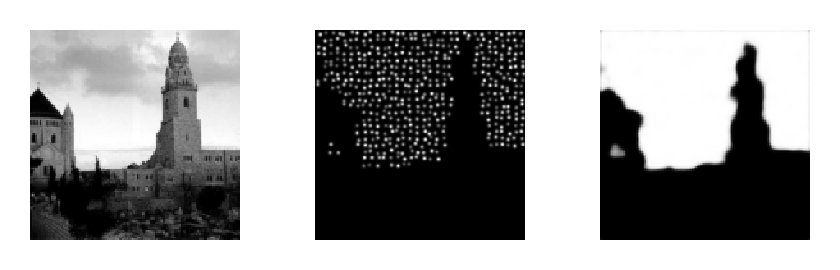

exp4_D1_S0


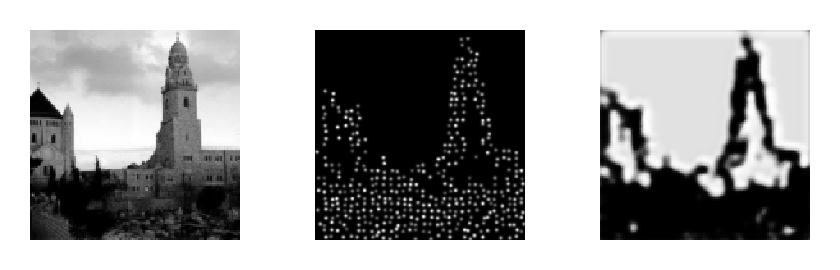

exp4_D2_S0


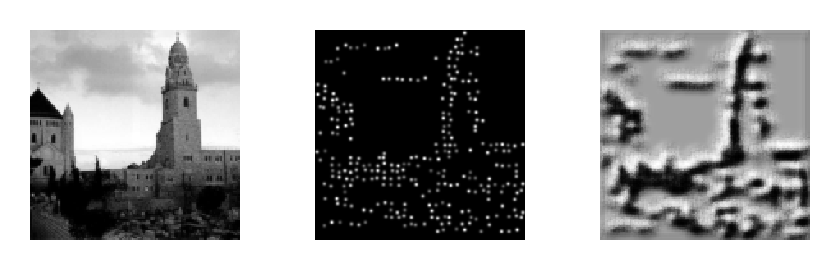

exp4_D3_S0


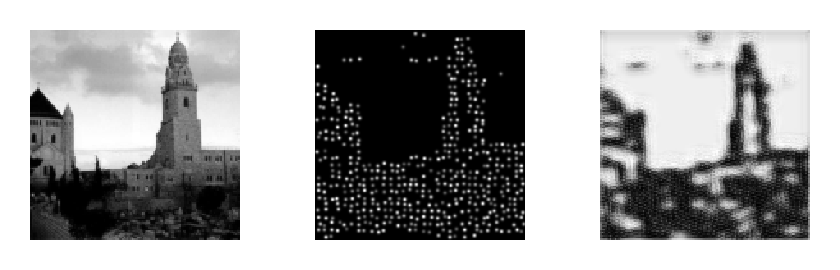

exp4_D4_S0


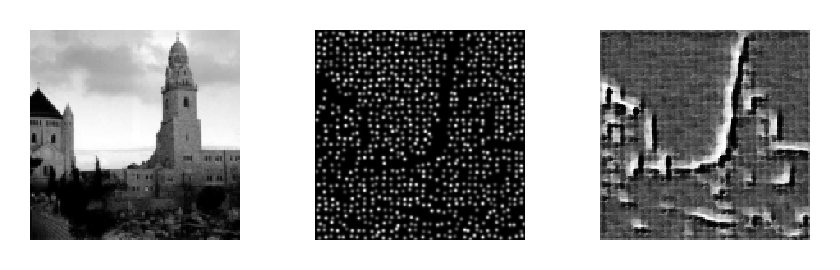

exp4_D5_S0


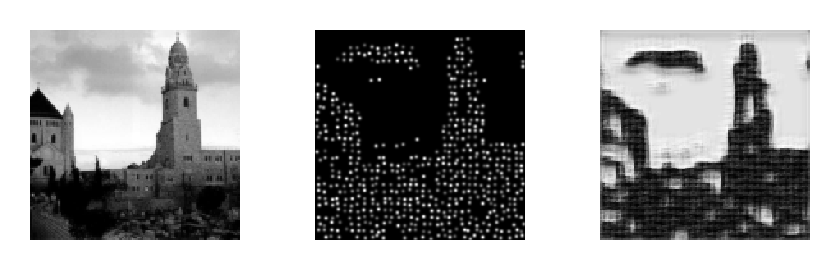

exp4_B_S0


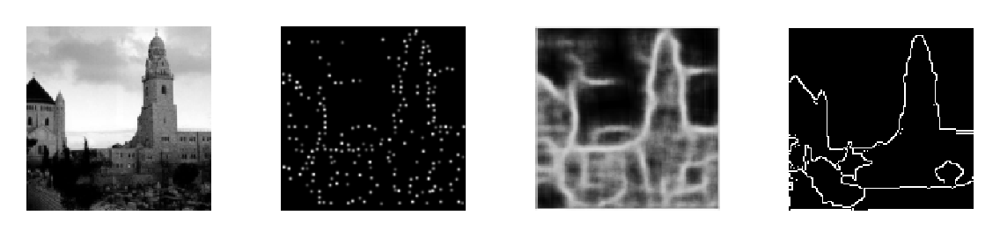

exp4_MSE_S1


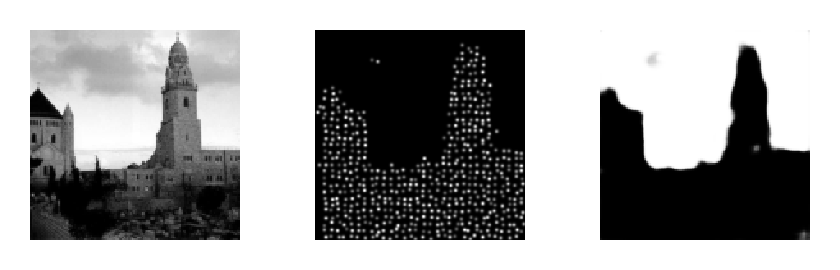

exp4_D1_S1


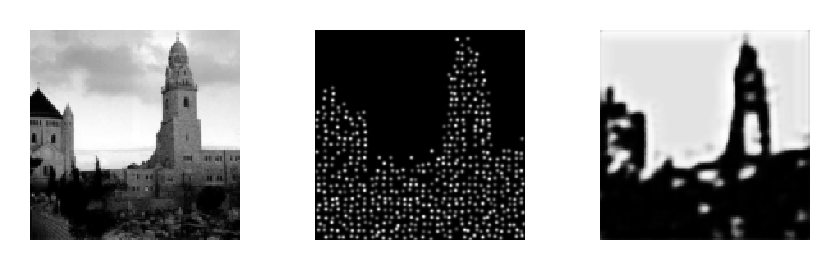

exp4_D2_S1


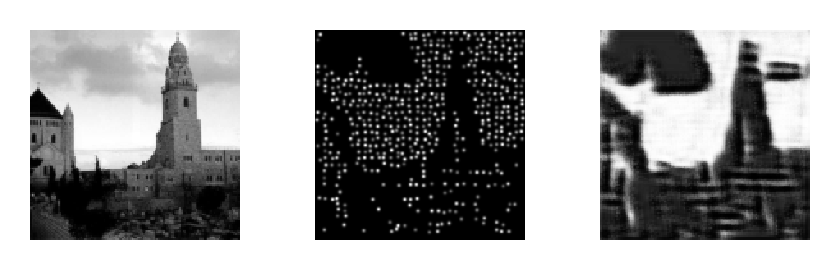

exp4_D3_S1


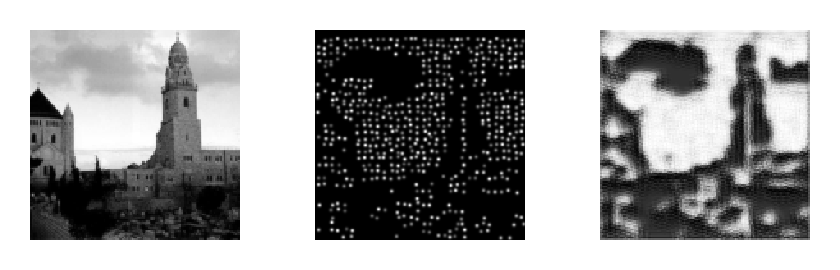

exp4_D4_S1


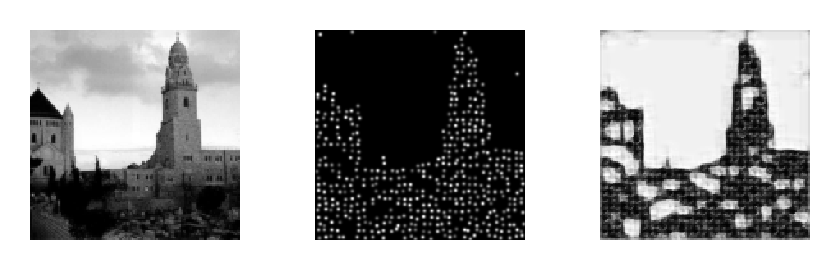

exp4_D5_S1


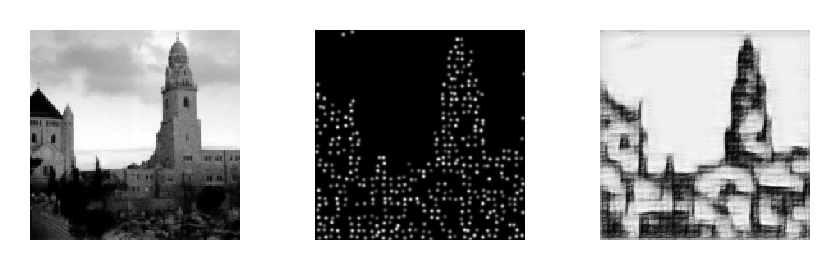

exp4_B_S1


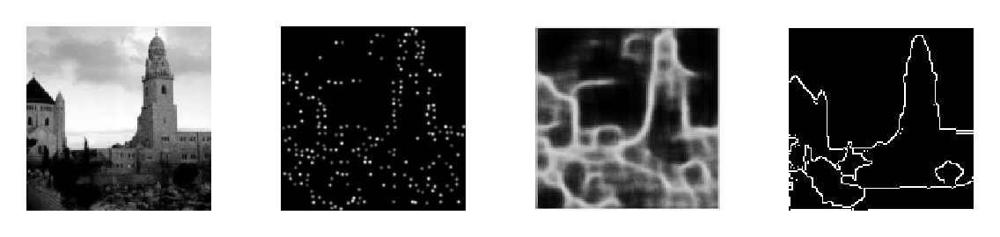

exp4_MSE_S2


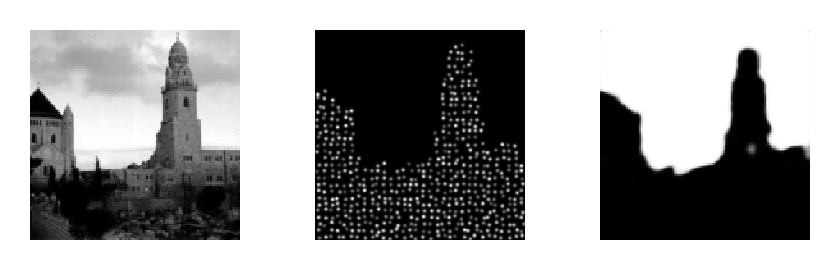

exp4_D1_S2


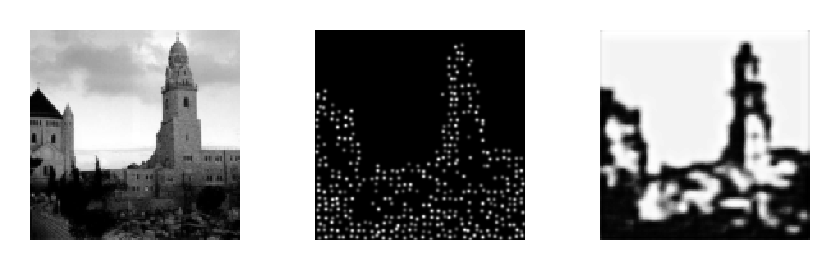

exp4_D2_S2


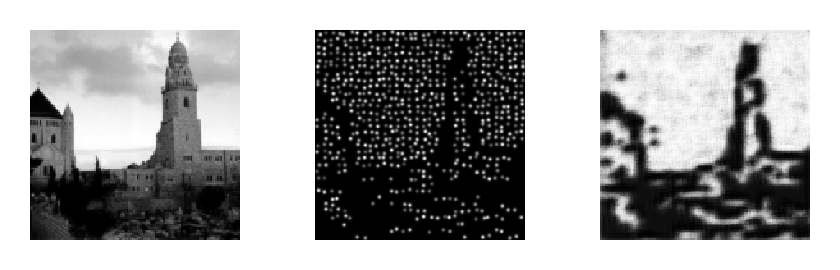

exp4_D3_S2


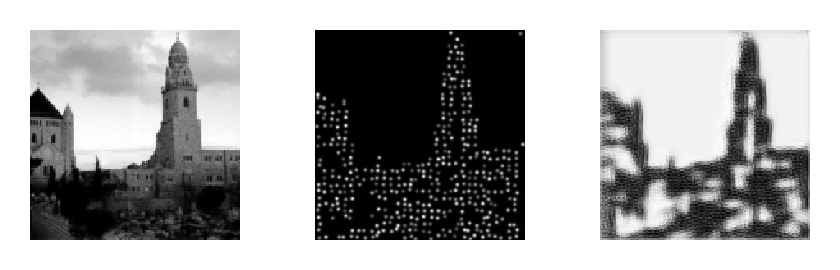

exp4_D4_S2


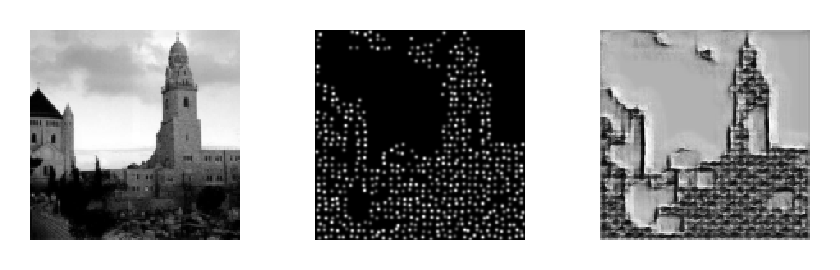

exp4_D5_S2


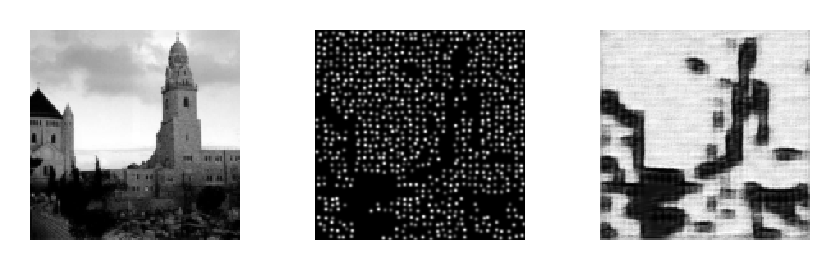

exp4_B_S2


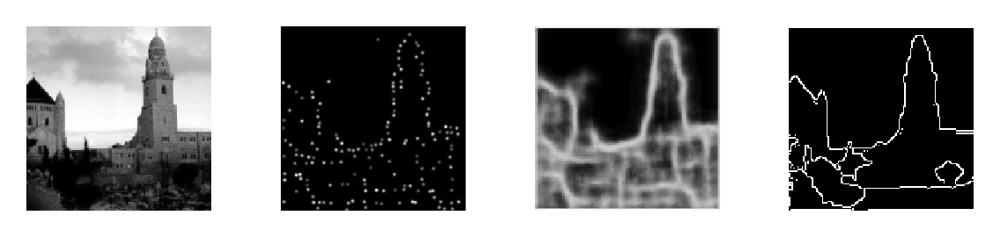

exp4_MSE_S3


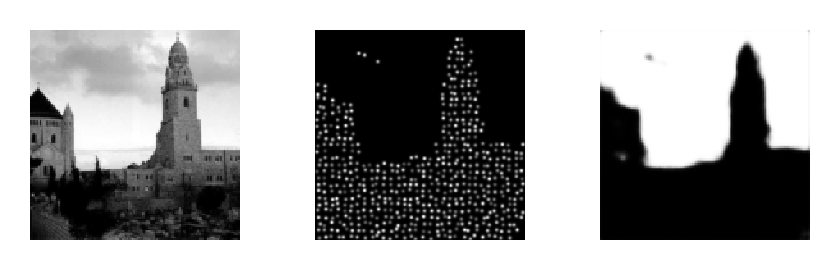

exp4_D1_S3


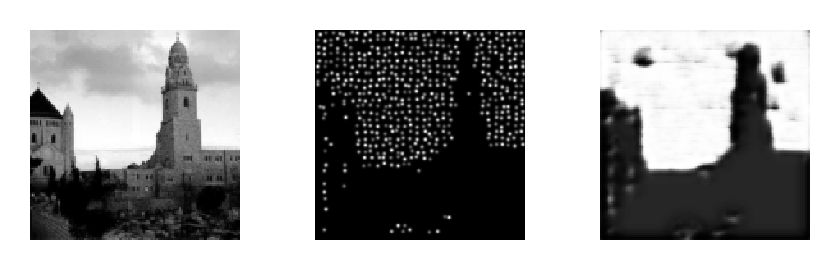

exp4_D2_S3


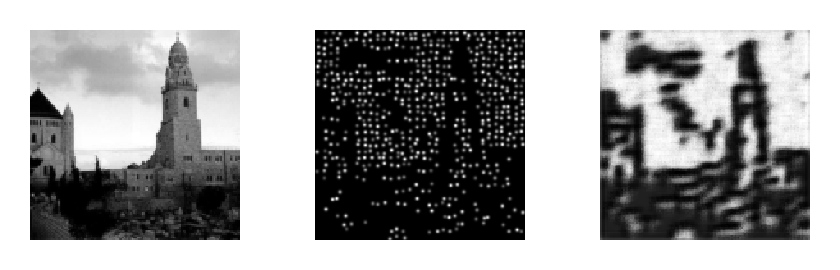

exp4_D3_S3


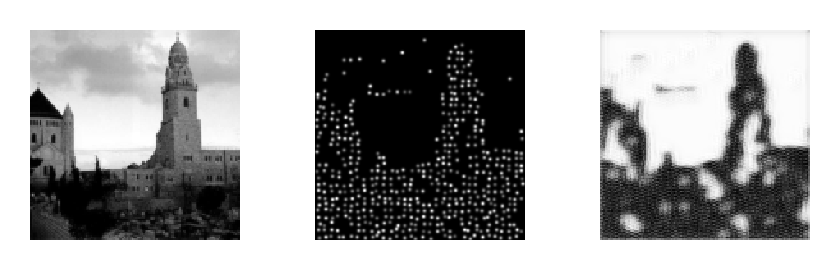

exp4_D4_S3


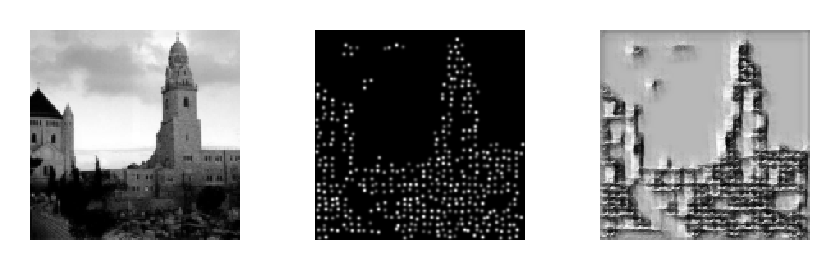

exp4_D5_S3


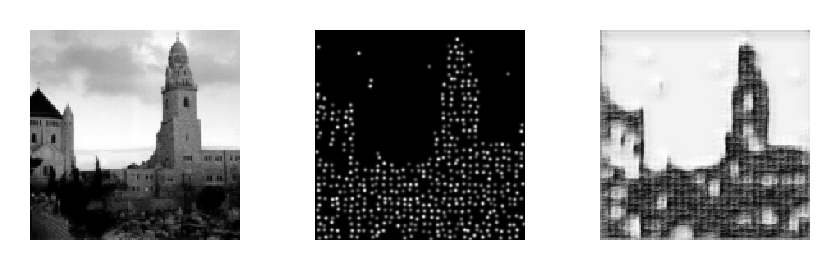

exp4_B_S3


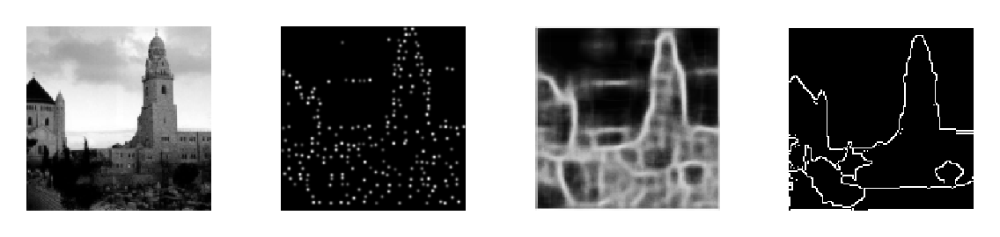

exp4_MSE_S4


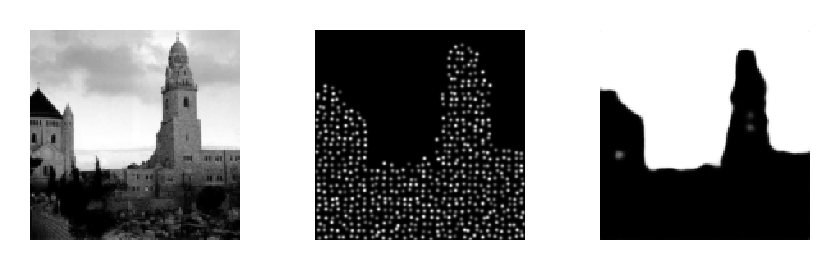

exp4_D1_S4


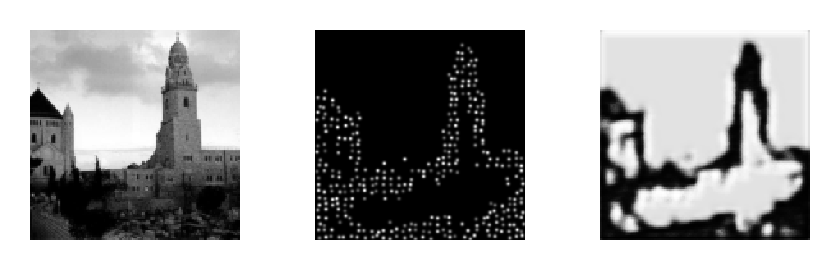

exp4_D2_S4


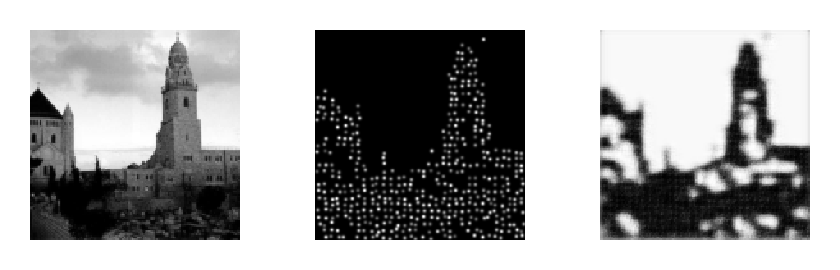

exp4_D3_S4


KeyboardInterrupt: 

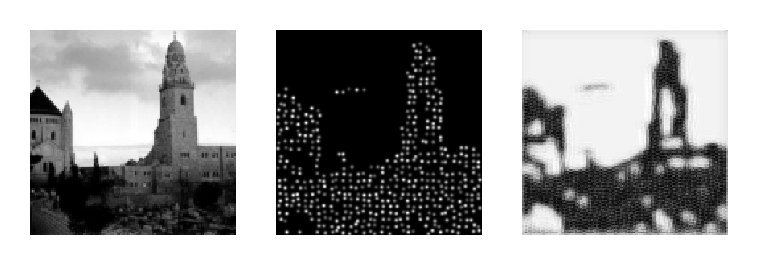

In [27]:
import evaluation 
training_protocol = pd.read_csv('training_configuration/config_may04.csv').replace({'None':None,'True':True,'False':False,np.nan:None})

# Read the saved training statistics
protocol = training_protocol.loc[training_protocol.experiment=='exp4']

id_vars=['savedir','experiment','model_name','condition','seed','learning_rate','kappa','reconstruction_loss_param']
dep_vars = ['epoch','val_total_loss', 'perc_active', 'mse', 'fsim', 'ssim','psnr', 'accuracy','sensitivity','specificity','precision']
results = pd.DataFrame(columns=id_vars+dep_vars)
pd.read_csv('results_3_jun_2021.csv')
train_stats ={} #dict with all train stats

for i, (_,cfg) in enumerate(protocol.iterrows()):
    if cfg.model_name not in results.model_name:
        print(cfg.model_name)
        results=results.append(cfg.loc[id_vars], ignore_index=True)
        stats, best_result = evaluation.read_train_stats(os.path.join(cfg.savedir,cfg.model_name+'_train_stats.csv'))
        train_stats[cfg.model_name] = stats
        results.loc[i,dep_vars] = best_result.reindex(dep_vars)
        metrics = evaluation.evaluate_saved_model(cfg, visualize=[1])
        results.loc[i,dep_vars] = results.loc[i,dep_vars].combine_first(metrics)


In [2]:
import evaluation 
training_protocol = pd.read_csv('training_configuration/config_may04.csv').replace({'None':None,'True':True,'False':False,np.nan:None})

# Read the saved training statistics
protocol = training_protocol.loc[training_protocol.experiment=='exp4']

id_vars=['savedir','experiment','model_name','condition','seed','learning_rate','kappa','reconstruction_loss_param']
dep_vars = ['epoch','val_total_loss', 'perc_active', 'mse', 'fsim', 'ssim','psnr', 'accuracy','sensitivity','specificity','precision']
# results = pd.DataFrame(columns=id_vars+dep_vars)
results = pd.read_csv('results_3_jun_2021.csv')
train_stats ={} #dict with all train stats

for i, (_,cfg) in enumerate(protocol.iterrows()):
    if cfg.model_name not in results.model_name.to_list():
        print(cfg.model_name)
        results=results.append(cfg.loc[id_vars], ignore_index=True)
        stats, best_result = evaluation.read_train_stats(os.path.join(cfg.savedir,cfg.model_name+'_train_stats.csv'))
        train_stats[cfg.model_name] = stats
        results.loc[i,dep_vars] = best_result.reindex(dep_vars)
        metrics = evaluation.evaluate_saved_model(cfg, visualize=[1])
        results.loc[i,dep_vars] = results.loc[i,dep_vars].combine_first(metrics)


In [3]:
results = results.sort_values(['condition','val_total_loss'])
summary = pd.DataFrame()
for c in results.condition.unique():
    summary = summary.append(results[results.condition==c].head(1))
summary

,savedir,experiment,model_name,condition,seed,learning_rate,kappa,reconstruction_loss_param,epoch,val_total_loss,perc_active,mse,fsim,ssim,psnr,accuracy,sensitivity,specificity,precision
3,./out/may04/exp4,exp4,exp4_B_S3,B,3,0.0002,0.06,0.925,4.400000,0.086384,24.102441,NaN,NaN,NaN,NaN,0.697362,0.721592,0.695238,0.164662
7,./out/may04/exp4,exp4,exp4_D1_S2,D1,2,0.0002,0.03,2.000,0.304260,0.207736,37.567139,0.054621,0.768736,0.564280,13.113278,NaN,NaN,NaN,NaN
11,./out/may04/exp4,exp4,exp4_D2_S1,D2,1,0.0002,0.03,4.000,0.548446,1.018084,43.203027,0.045915,0.773214,0.558612,13.837107,NaN,NaN,NaN,NaN
19,./out/may04/exp4,exp4,exp4_D3_S4,D3,4,0.0002,0.03,7.000,0.230061,2.104191,49.272412,0.064191,0.760691,0.540616,12.538274,NaN,NaN,NaN,NaN
21,./out/may04/exp4,exp4,exp4_D4_S1,D4,1,0.0002,0.03,11.000,0.373961,36.508324,59.787598,0.055116,0.764390,0.537485,13.150597,NaN,NaN,NaN,NaN
29,./out/may04/exp4,exp4,exp4_D5_S4,D5,4,0.0002,0.03,13.000,0.296663,55.716660,62.493604,0.067077,0.720567,0.474024,12.277728,NaN,NaN,NaN,NaN
31,./out/may04/exp4,exp4,exp4_MSE_S1,MSE,1,0.0002,0.06,0.000,4.866667,0.639281,69.520312,0.033703,0.718692,0.553502,15.446615,NaN,NaN,NaN,NaN


In [23]:
# r = results.sort_values('model_name').iloc[:,1:]
# r.to_csv('results_3_jun_2021.csv',index=False)

exp4_B_S3


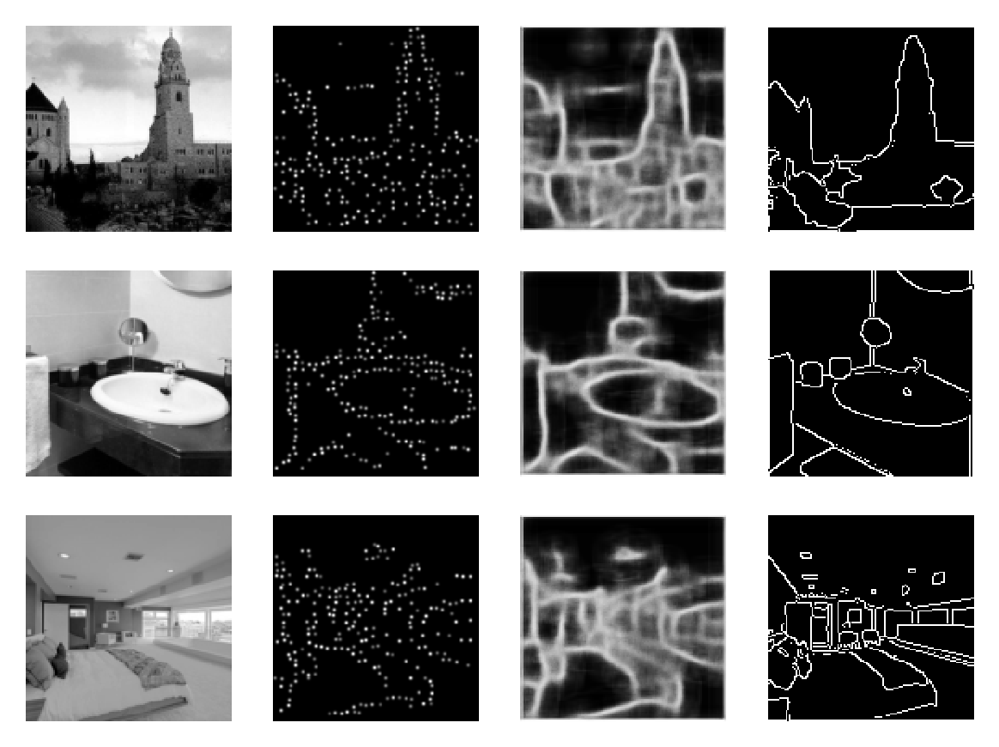

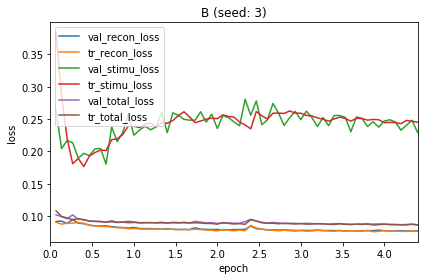

exp4_D1_S2


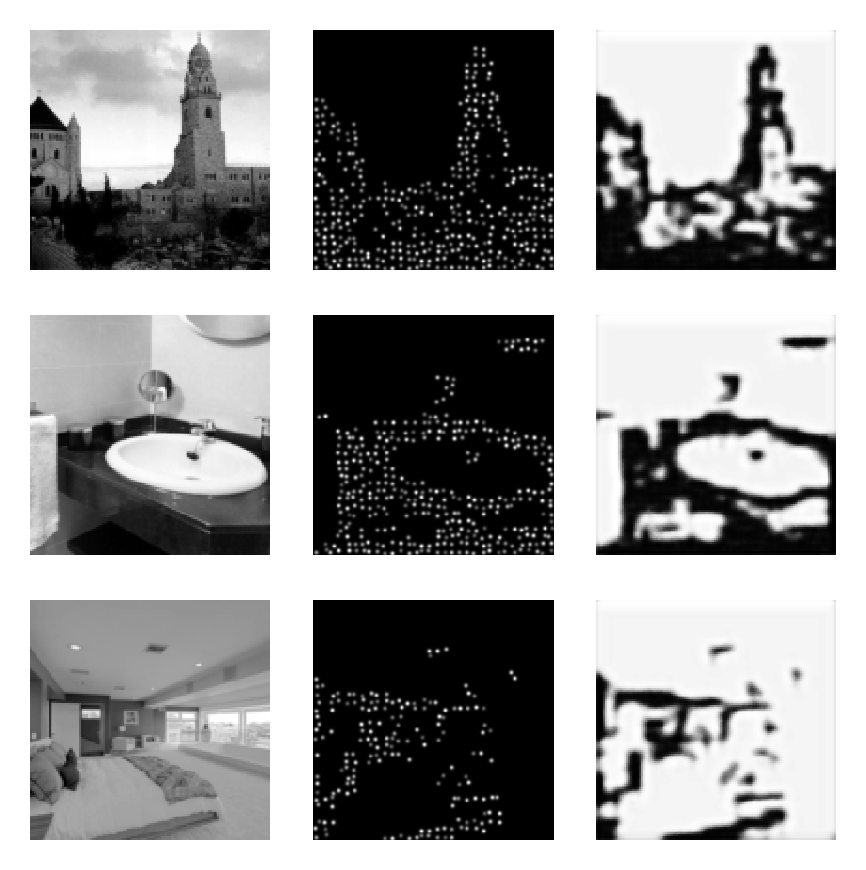

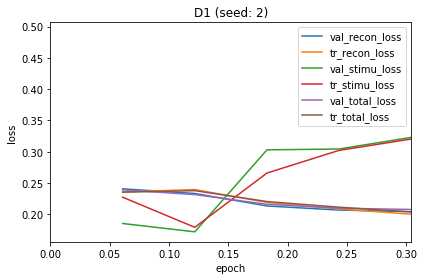

exp4_D2_S1


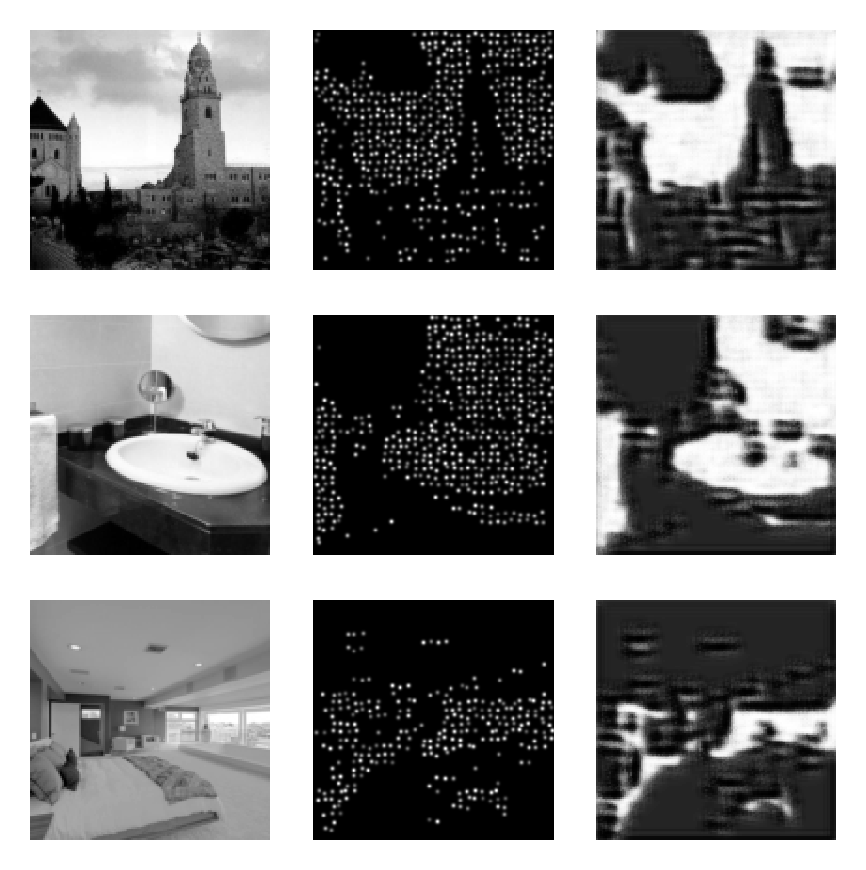

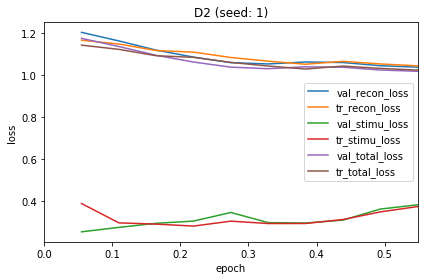

exp4_D3_S4


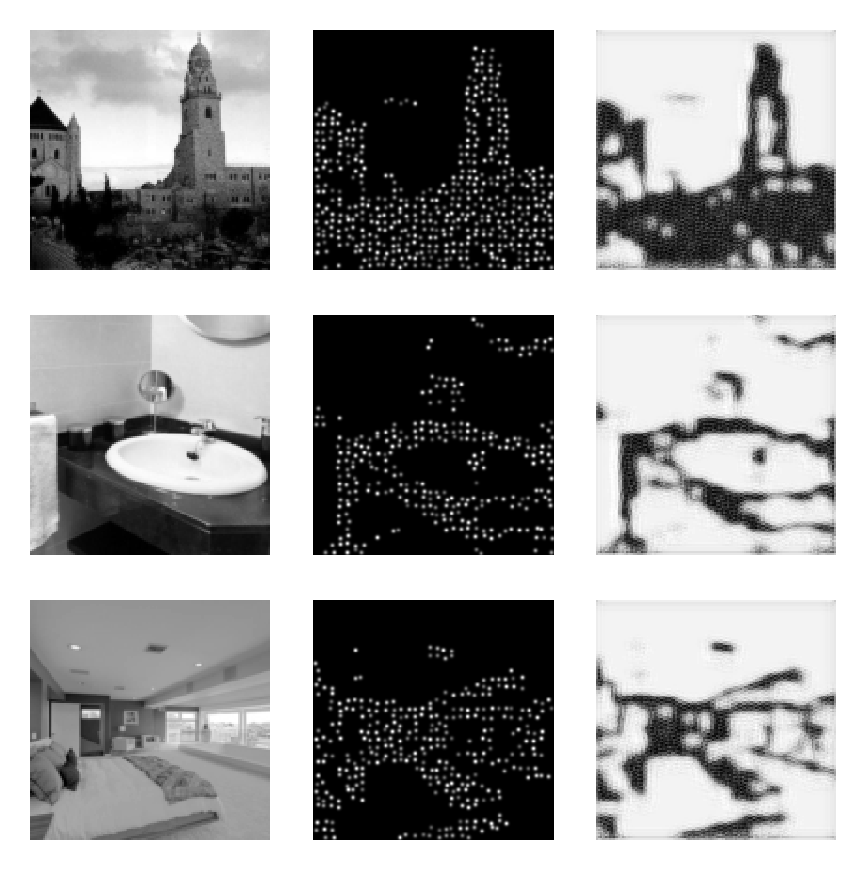

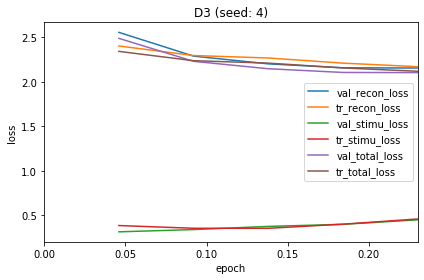

exp4_D4_S1


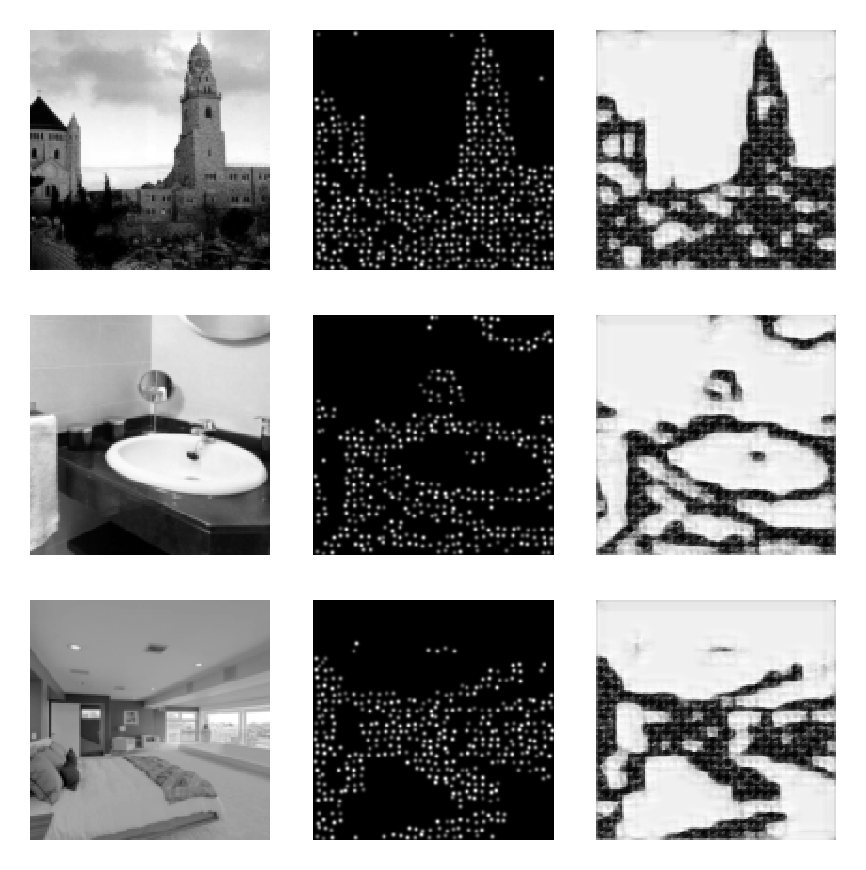

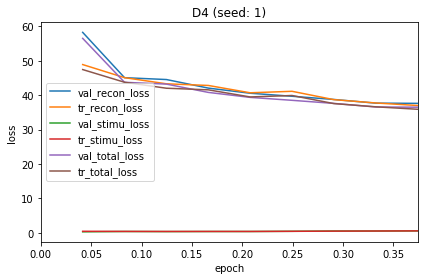

exp4_D5_S4


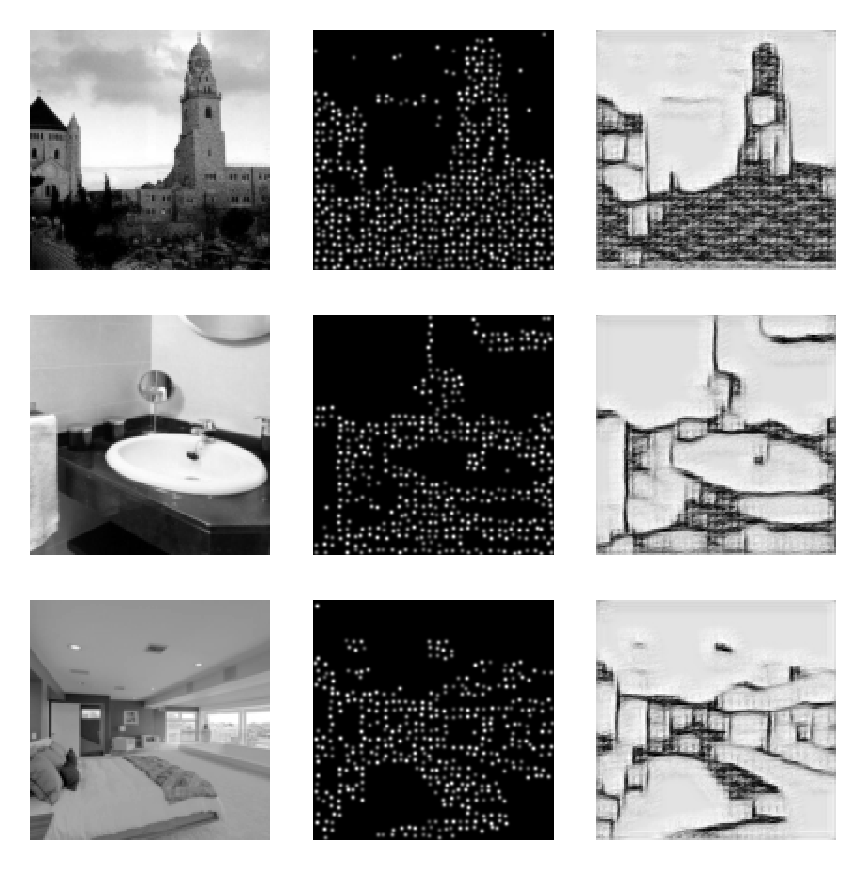

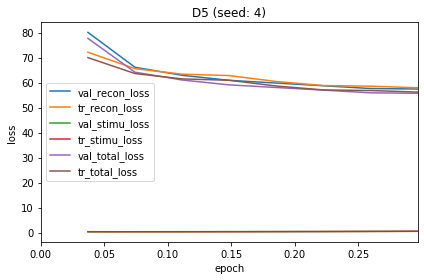

exp4_MSE_S1


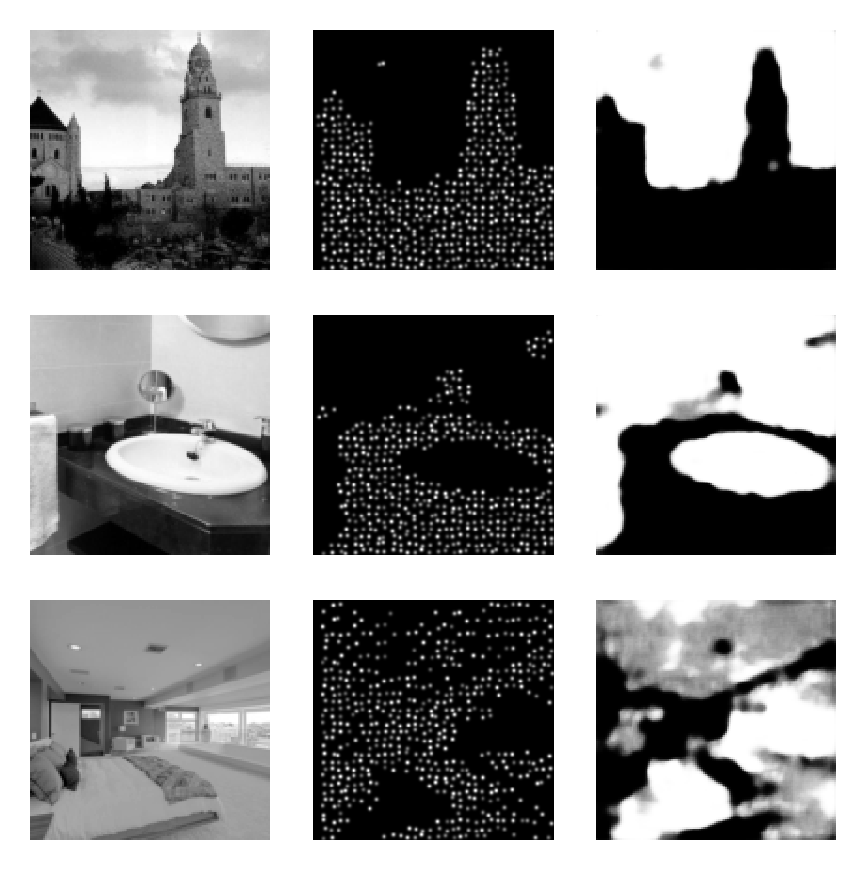

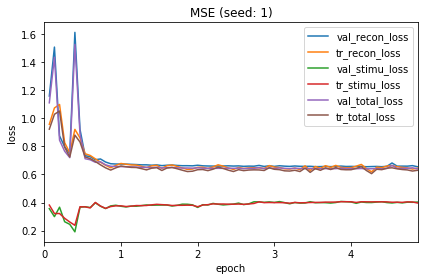

In [4]:
im_pairs =[]
for _, model in summary.iterrows():
    cfg = protocol.loc[protocol.model_name==model.model_name].squeeze()
    cfg.batch_size=250
    print(model.model_name)
    im_pairs.append(evaluation.evaluate_saved_model(cfg,visualize=[1,156,249])) #,190, 109, 221
    stats, best_result = evaluation.read_train_stats(os.path.join(cfg.savedir,cfg.model_name+'_train_stats.csv'))

    # Plot training curves
    g = sns.lineplot(data=stats,x='epoch',y='value',hue='variable')
    handles, labels = g.get_legend_handles_labels()
    g.legend(handles=handles[1:], labels=labels[1:])
    plt.ylabel('loss')
    plt.title('%s (seed: %d)' %(cfg.condition,cfg.seed))
    plt.xlim([0,best_result.epoch])
    plt.tight_layout()
    plt.show()

## EXP 4b - Comparison with CED and HED


In [28]:
def roc_analysis(pred_,targ, n_bins=25):
    """Returns confusion quadrant for raw prediction and binary target at different levels
    of thresholding of the prediction
    pred_ : raw (continuous, non-thresholded) prediction tensor
    targ: binary target tensor 
    returns: dictionary with tp,fp,fn,tn (i.e. true/false positives/negatives)"""
    confusion_quadrants = []
    for t in np.linspace(0.01,0.99, n_bins):
        pred = (pred_ > t).float()
        tp = pred[targ==1].sum().float().cpu().numpy()
        fp = pred[targ==0].sum().float().cpu().numpy()
        fn = targ[pred==0].sum().float().cpu().numpy()
        tn = (targ[pred==0] == 0).sum().float().cpu().numpy()
        
        confusion_quadrants.append({'thr':t,'tp':tp, 'fp':fp, 'fn':fn, 'tn':tn})
    return confusion_quadrants

/scratch/jaap/miniconda3/envs/py36/lib/python3.6/site-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


exp4_B_S3


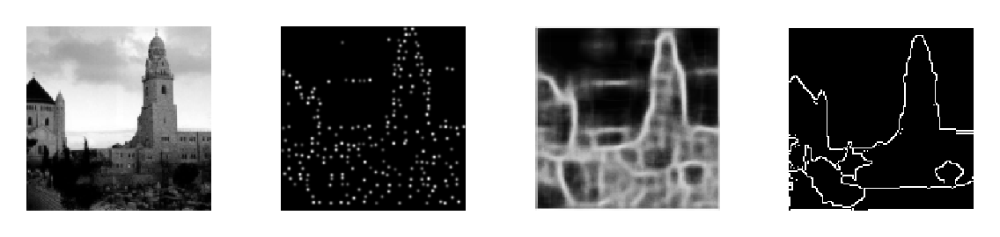

exp4_D1_S2


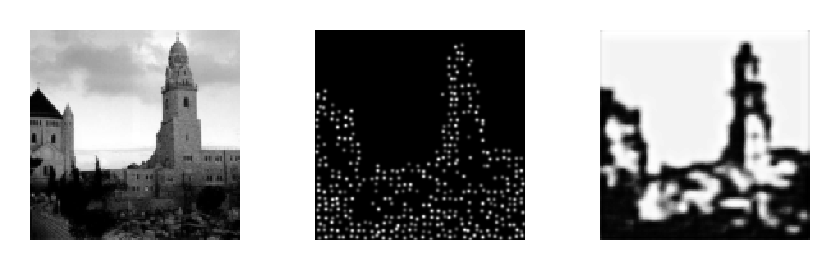

exp4_D2_S1


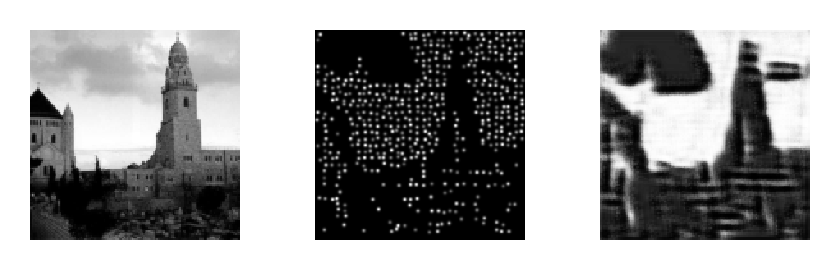

exp4_D3_S4


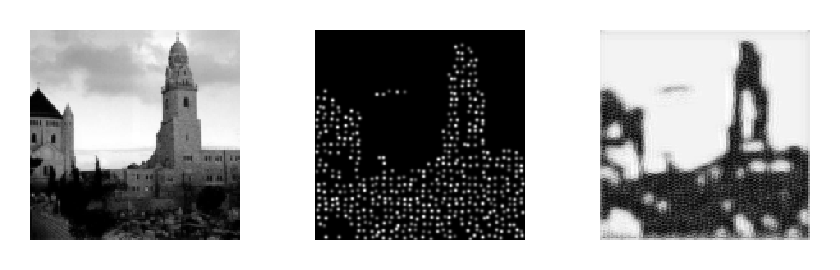

exp4_D4_S1


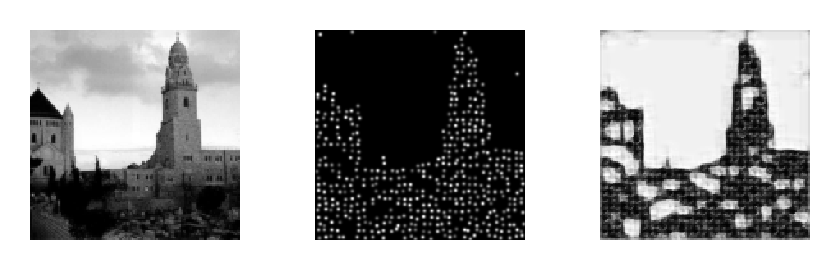

exp4_D5_S4


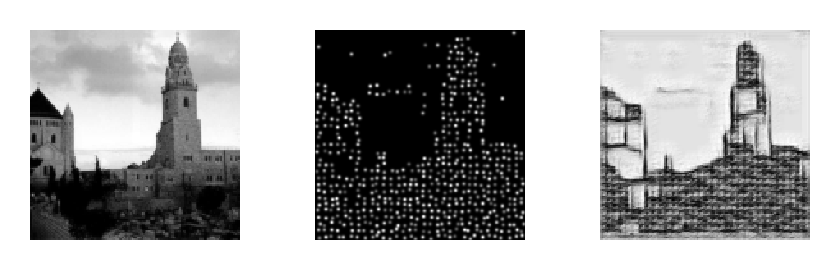

exp4_MSE_S1


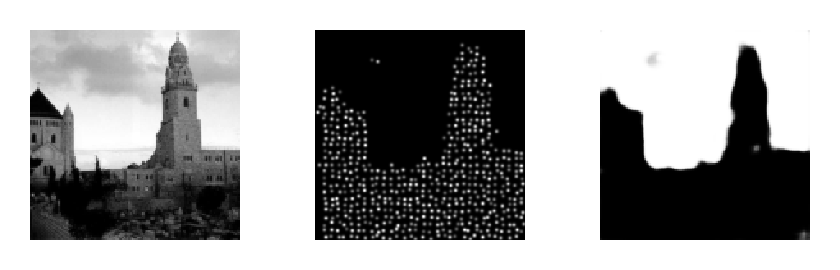

exp4b_bced_S4


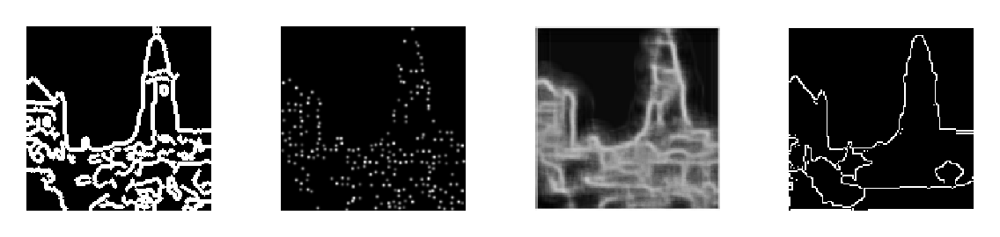

exp4b_bhed_S1


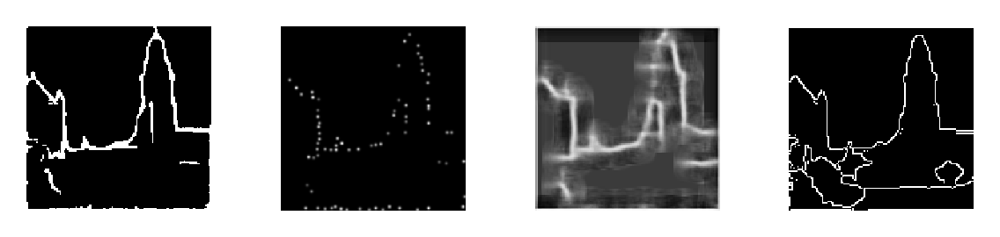

exp4b_mced_S4


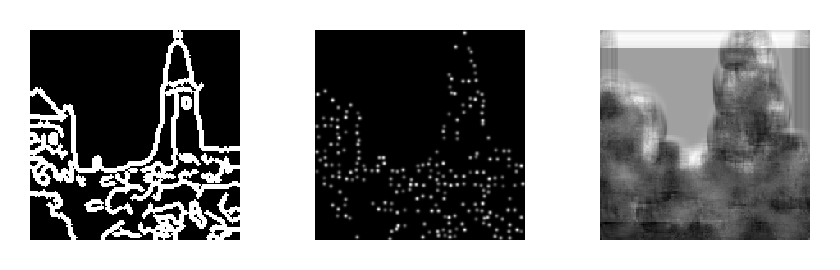

exp4b_mhed_S2


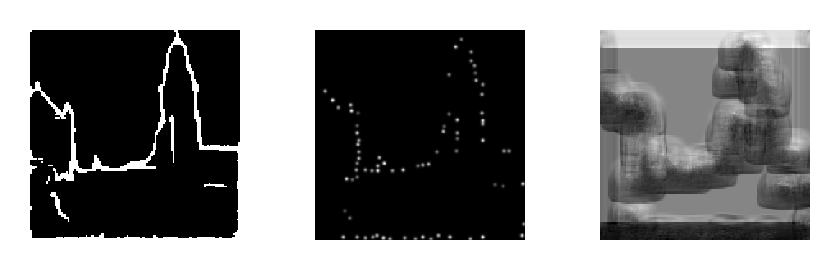

exp4b_vced_S2


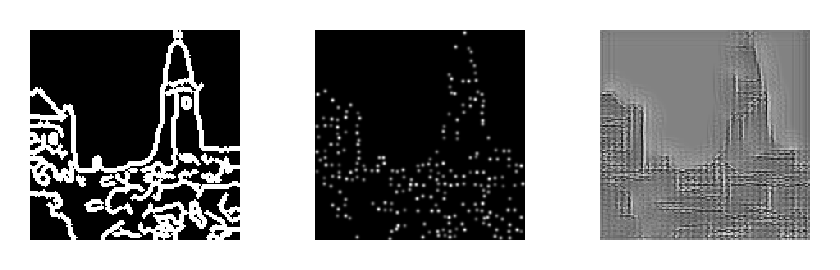

exp4b_vhed_S2


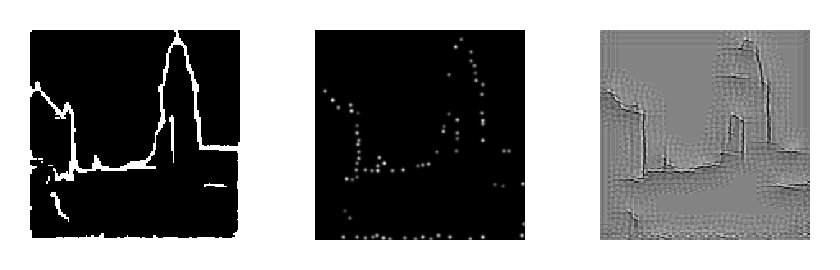

In [29]:
import evaluation
all_metrics = dict()
p1 = pd.read_csv('training_configuration/config_may04.csv').replace({'None':None,'True':True,'False':False,np.nan:None})
p2 = pd.read_csv('training_configuration/config_may04b.csv').replace({'None':None,'True':True,'False':False,np.nan:None})
training_protocol = p2.append(p1.loc[p1.experiment=='exp4'],ignore_index=True)

VISUALIZE=[1]
SAVEFIG=False
SEED = 0


## A. Summarize training performance 
id_vars=list(training_protocol.columns)
dep_vars = ['epoch','val_total_loss']
results = pd.DataFrame(columns=id_vars+dep_vars)
train_stats ={} #dict with all train stats

for i,cfg in training_protocol.iterrows():
    results=results.append(cfg.loc[id_vars], ignore_index=True)
    stats, best_result = evaluation.read_train_stats(os.path.join(cfg.savedir,cfg.model_name+'_train_stats.csv'))
    train_stats[cfg.model_name] = stats
    results.loc[i,dep_vars] = best_result.reindex(dep_vars)


results = results.sort_values(['condition','val_total_loss'])
summary = pd.DataFrame()
for c in results.condition.unique():
    summary = summary.append(results[results.condition==c].head(1))


# #B. Evaluate the performance metrics 
# for each best model (i.e. random restart instance) per condition

for i,cfg in summary.iterrows():
# resterend = training_protocol.loc[training_protocol.model_name.isin(['exp4_B_S3', 'exp4b_bced_S4', 'exp4b_bhed_S2'])]
# for i,cfg in resterend.iterrows():
    E2E_ENCODER = cfg.model_name in list(p1.model_name)
    print(cfg.model_name)
    models, dataset, optimization, train_settings = training.initialize_components(cfg)

    if not E2E_ENCODER:
        models['encoder'] = model.Intensity_Encoder().to(cfg.device)
        models['simulator'] = model.E2E_PhospheneSimulator(pMask=models['simulator'].pMask.clone().to(cfg.device),
                                                                   scale_factor=2,
                                                                   sigma=1.5,
                                                                   intensity=10,
                                                                   device=cfg.device).to(cfg.device)
        img_kind = 'hed' if cfg.condition.endswith('hed') else 'ced'
        trg_kind = 'lbl' if cfg.condition.startswith('b') else 'img' #boundary vs image reconstr.
        trainset = local_datasets.HED_Dataset(device=cfg.device,img_kind=img_kind,trg_kind=trg_kind)
        valset = local_datasets.HED_Dataset(device=cfg.device,img_kind=img_kind,trg_kind=trg_kind, validation=True)
        dataset['trainloader'] = DataLoader(trainset,batch_size=int(cfg.batch_size),shuffle=True)
        dataset['valloader'] = DataLoader(valset,batch_size=min([len(valset),100]),shuffle=False)
        dataset['trainset'] = trainset
        dataset['valset'] = valset
        optimization['lossfunc'].target = 'label'

    
    encoder = models['encoder']
    decoder = models['decoder']
    simulator = models['simulator']
    valloader = dataset['valloader']
    lossfunc = optimization['lossfunc']
    
    # Load model parameters
    encoder.load_state_dict(torch.load(os.path.join(cfg.savedir,cfg.model_name+'_best_encoder.pth')))
    decoder.load_state_dict(torch.load(os.path.join(cfg.savedir,cfg.model_name+'_best_decoder.pth')))
    encoder.eval()
    decoder.eval()
    
    
    n_processed = 0
    metrics = None
    roc = None
    
    torch.manual_seed(SEED)
    np.random.seed(SEED)
    
    if VISUALIZE is not None:
        n_figs = 4 if cfg.reconstruction_loss == 'boundary' else 3
        n_examples = len(VISUALIZE)
        plt.figure(figsize=(n_figs,n_examples),dpi=300)
        i = 0
        
    
    # Forward pass (validation set)
    for batch, data in enumerate(valloader, 0):
        image,label = data
        with torch.no_grad():
            stimulation = encoder(image)
            phosphenes  = simulator(stimulation)
            reconstruction = decoder(phosphenes)
            
        # Undo normalization (if necessary)
        if image.min()<0:
            if image.shape[1]==3:
                normalizer = utils.TensorNormalizer(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            elif image.shape[1]==1:
                normalizer = utils.TensorNormalizer(mean=0.459, std=0.227)
            image = normalizer.undo(image)
            reconstruction = normalizer.undo(reconstruction) if lossfunc.target == 'image' else reconstruction
        
        # Calculate the performance metrics (perc. active electrodes, IQA, seqm. performance)
        pred = reconstruction
        targ = image if lossfunc.target == 'image' else label
        if not E2E_ENCODER:
            trg_kind = 'label' if cfg.condition.startswith('b') else 'image'
        else:
            trg_kind = lossfunc.target
        new = evaluation.performance_metrics(stimulation, pred, targ, targ_type=trg_kind)
        
        if metrics is None:
            metrics = pd.DataFrame(columns=list(new.index))
        metrics = metrics.append(new, ignore_index=True)
        
        if 'auc_score' in metrics:
            # Receiver-operator curve (ROC)
            new = roc_analysis(pred,targ,n_bins=50)
            if roc is None:
                roc = new
            else:
                roc = [{**{'thr':n['thr']},**{key: n[key] + roc[i][key] for key in ['tp','fp','fn','tn']}} for i,n in enumerate(new)]
            
        # Visualize results
        if VISUALIZE is not None:
            for example in VISUALIZE:
                b,idx = divmod(example, len(image))
                if b == batch:
                    plt.subplot(n_examples,n_figs,n_figs*i+1)
                    plt.imshow(image[idx].squeeze().cpu().numpy(),cmap='gray')
                    plt.axis('off')
                    plt.subplot(n_examples,n_figs,n_figs*i+2)
                    plt.imshow(phosphenes[idx].squeeze().cpu().numpy(),cmap='gray')
                    plt.axis('off')

                    if n_figs > 3:
                        plt.subplot(n_examples,n_figs,n_figs*i+3)
                        plt.imshow(reconstruction[idx].squeeze().cpu().numpy(),cmap='gray')
                        plt.axis('off')
                        plt.subplot(n_examples,n_figs,n_figs*i+4)
                        plt.imshow(label[idx].squeeze().cpu().numpy(),cmap='gray')
                        plt.axis('off')

                    else:
                        plt.subplot(n_examples,n_figs,n_figs*i+3)
                        plt.imshow(reconstruction[idx].squeeze().cpu().numpy(),cmap='gray')
                        plt.axis('off')
                    i += 1
            if batch == len(valloader)-1:
                if SAVEFIG:
                    plt.savefig(os.path.join(cfg.savedir,cfg.model_name+'eval.png'))

                plt.tight_layout()
                plt.show()
    if roc is not None:
        pd.DataFrame(roc).to_csv('out/may04/Results/roc_{}.csv'.format(cfg.model_name),index=False)   
    pd.DataFrame(metrics).to_csv('out/may04/Results/metrics_{}.csv'.format(cfg.model_name),index=False)
    all_metrics[cfg.model_name] = metrics

### ROC ANALYSIS

In [31]:
data = pd.DataFrame(columns=['model_name','thr','FPR','TPR'])
for model_name in ['exp4_B_S3','exp4b_bced_S4','exp4b_bhed_S1',]:
    curve = pd.read_csv('out/may04/Results/roc_{}.csv'.format(model_name))
    curve['TPR'] = curve.tp/(curve.tp+curve.fn)
    curve['FPR'] = curve.fp/(curve.fp+curve.tn)
    curve['model_name'] = model_name
    data = data.append(curve.loc[:,['thr','TPR','FPR','model_name']])

colors = [(0.12156862745098039, 0.4666666666666667, 0.7058823529411765,1.),
 (1.0, 0.4980392156862745, 0.054901960784313725,1.),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313,1.)]
points = data.loc[data.thr==0.51]
plt.scatter(points.FPR,points.TPR, c=colors)

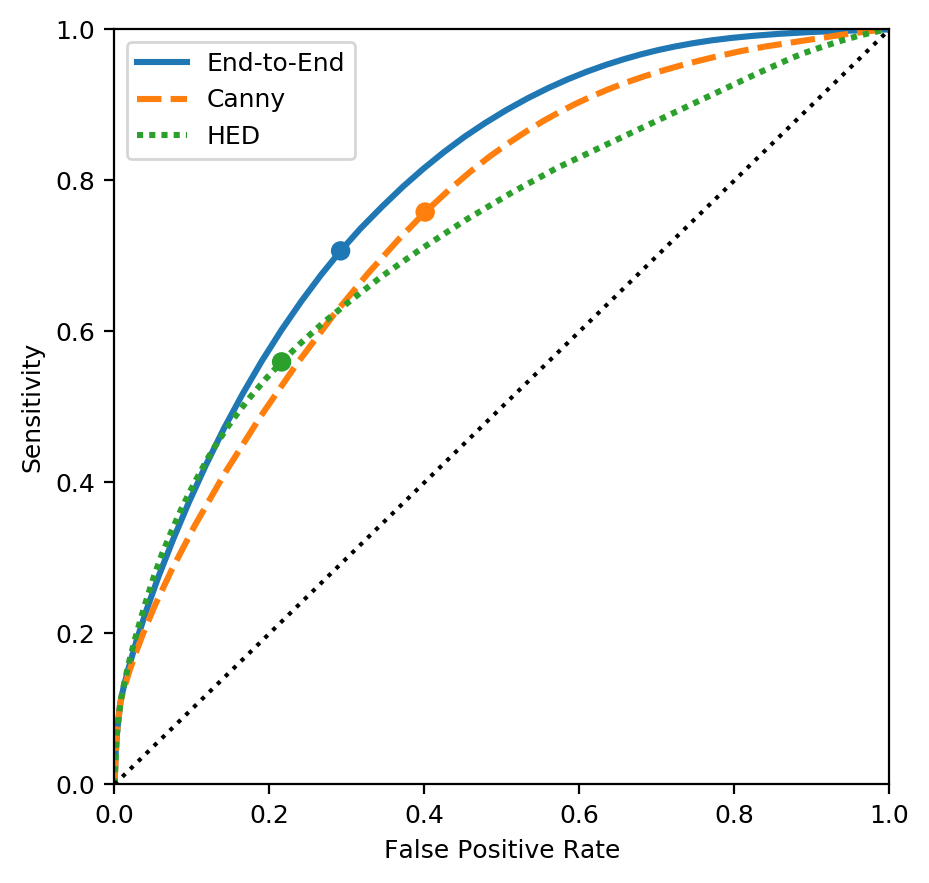

In [72]:
import matplotlib
plt.figure(figsize=(5,5),dpi=200)
matplotlib.rcParams.update({'font.size': 9})
ax = sns.lineplot(data=data,x='FPR',y='TPR',hue='model_name',style='model_name',linewidth=2.2)
plt.legend(['End-to-End','Canny','HED'])
ax.plot([0, 1], [0, 1], 'k:', transform=ax.transAxes)
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('Sensitivity')
plt.scatter(points.FPR,points.TPR, c=colors)
plt.show()

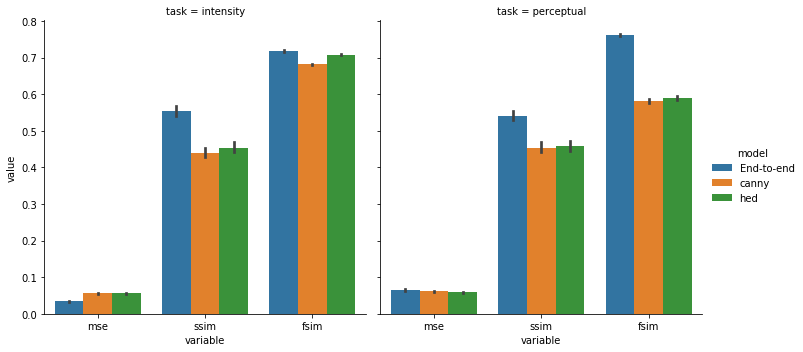

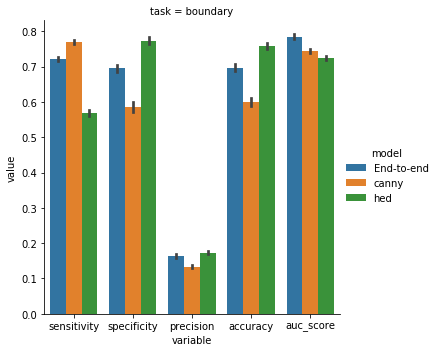

,model_name,perc_active,mse,ssim,fsim
0,exp4_B_S3,24.1024,NaN,NaN,NaN
1,exp4_D3_S4,49.2724,0.0643,0.5404,0.7609
2,exp4_MSE_S1,69.5203,0.0338,0.5528,0.7178
3,exp4b_bced_S4,28.5010,NaN,NaN,NaN
4,exp4b_bhed_S1,10.7506,NaN,NaN,NaN
5,exp4b_mced_S4,28.5010,0.0561,0.4392,0.6815
6,exp4b_mhed_S2,10.7506,0.0566,0.4530,0.7082
7,exp4b_vced_S2,28.5010,0.0613,0.4537,0.5808
8,exp4b_vhed_S2,10.7506,0.0591,0.4584,0.5890


In [144]:
intensity   = ['exp4_MSE_S1','exp4b_mced_S4','exp4b_mhed_S2']
perceptual  = ['exp4_D3_S4','exp4b_vced_S2','exp4b_vhed_S2']
boundary    = ['exp4_B_S3','exp4b_bced_S4','exp4b_bhed_S1']
end_to_end  = ['exp4_B_S3','exp4_D3_S4','exp4_MSE_S1']#, 'exp4_D1_S2','exp4_D2_S1','exp4_D4_S1','exp4_D5_S4']
canny       = ['exp4b_bced_S4','exp4b_mced_S4', 'exp4b_vced_S2']
hed         = [ 'exp4b_bhed_S1', 'exp4b_mhed_S2','exp4b_vhed_S2']
i_metrics = ['mse','ssim','fsim']
b_metrics = ['accuracy','sensitivity','specificity','precision','auc_score']

data = pd.DataFrame(columns=['model_name','variable','value','model','task'])
for model_name in intensity+perceptual+boundary: #summary.model_name:
    new  = pd.read_csv('out/may04/Results/metrics_{}.csv'.format(model_name)).melt()
    new['model_name'] = model_name
    new['model'] = 'End-to-end' if model_name in end_to_end else 'canny' if model_name in canny else 'hed'
    new['task'] = 'perceptual' if model_name in perceptual else 'intensity' if model_name in intensity else 'boundary'
    data = data.append(new,ignore_index=True)
sns.catplot(data=data.loc[data.variable.isin(i_metrics)],x='variable',y='value',hue='model',
            kind='bar', col='task',sharex=False)
sns.catplot(data=data.loc[data.variable.isin(b_metrics)],x='variable',y='value',hue='model',
            kind='bar', col='task',sharex=False)
plt.show()
d = data.groupby(['model_name','variable']).mean().unstack(level=1)
d.columns = [col[1] for col in d.columns]
display(d[['perc_active','mse','ssim','fsim']].reset_index())

# data = pd.DataFrame(columns=['variable','value','model'])
# for model_name in ['exp4_B_S3','exp4b_bced_S4','exp4b_bhed_S1',]: #summary.model_name:
#     new  = pd.read_csv('out/may04/Results/metrics_{}.csv'.format(model_name)).melt()
#     new['model'] = model_name
#     data = data.append(new,ignore_index=True)
# sns.barplot(data=data.loc[data.variable.isin(['sensitivity','specificity','accuracy','precision','auc_score'])],x='variable',y='value',hue='model')
# # sns.barplot(data=data,x='variable',y='value',hue='model')
# plt.show()
# d = data.groupby(['model','variable']).mean().unstack(level=1)

# d.columns = [col[1] for col in d.columns]
# display(d[['perc_active','accuracy','sensitivity','specificity','precision','auc_score']])



In [146]:
import scipy 
pd.set_option('display.precision',4) # default is 6

for model_names in [['exp4_D3_S4','exp4_MSE_S1'],intensity,perceptual]: #list(data.model_name.unique())
    stats  = ['perc_active','mse','ssim','fsim']
    index  = pd.MultiIndex.from_product([model_names,stats])
    df     = pd.DataFrame(index=model_names,columns=index)


    
    
    for m1 in model_names:
        for m2 in model_names:
            if m2 == m1:
                continue
            for stat in stats:
                x = data.loc[(data.model_name==m1) & (data.variable == stat)].value
                y = data.loc[(data.model_name==m2) & (data.variable == stat)].value
                _, p = scipy.stats.ttest_rel(x,y)
#                 print(['({}) {} vs {} - pvalue: {}'.format(stat,m1,m2,p)])
                df.loc[m1,(m2,stat)] = p
        
    upper  = np.triu(np.ones((df.shape[0],df.shape[1]//len(stats)))).repeat(len(stats),axis=1).astype(bool)# Upper triangular matrix
    df.iloc[upper]= '-'  
    display(df.iloc[:,:-4])
    
    
model_names = boundary
stats       = ['perc_active','accuracy','sensitivity','specificity','precision','auc_score']
index       = pd.MultiIndex.from_product([model_names,stats])
df          = pd.DataFrame(index=model_names,columns=index)

for m1 in model_names:
    for m2 in model_names:
        if m2 == m1:
            continue
        for stat in stats:
            x = data.loc[(data.model_name==m1) & (data.variable == stat)].value
            y = data.loc[(data.model_name==m2) & (data.variable == stat)].value
            _, p = scipy.stats.ttest_rel(x,y)
#                 print(['({}) {} vs {} - pvalue: {}'.format(stat,m1,m2,p)])
            df.loc[m1,(m2,stat)] = p

upper       = np.triu(np.ones((df.shape[0],df.shape[1]//len(stats)))).repeat(len(stats),axis=1).astype(bool)
df.iloc[upper]= '-'  
display(df.iloc[:,:-6])

exp4_D3_S4                                 
            perc_active        mse       ssim       fsim
exp4_D3_S4            -          -          -          -
exp4_MSE_S1   5.247e-19  2.307e-22  3.737e-14  1.421e-14

exp4_MSE_S1                                  exp4b_mced_S4  \
              perc_active        mse       ssim       fsim   perc_active   
exp4_MSE_S1             -          -          -          -             -   
exp4b_mced_S4   6.715e-24  4.491e-20  4.096e-24  1.523e-11             -   
exp4b_mhed_S2   1.072e-24  3.921e-20  7.324e-24  8.519e-05     1.939e-19   

                                              
                   mse       ssim       fsim  
exp4_MSE_S1          -          -          -  
exp4b_mced_S4        -          -          -  
exp4b_mhed_S2  0.01102  3.134e-14  1.326e-14

exp4_D3_S4                                 exp4b_vced_S2  \
              perc_active       mse       ssim       fsim   perc_active   
exp4_D3_S4              -         -          -          -             -   
exp4b_vced_S2    4.95e-20  0.000136  3.431e-22  3.472e-22             -   
exp4b_vhed_S2   1.883e-20  4.56e-06  1.705e-21  1.199e-20     1.939e-19   

                                                
                     mse       ssim       fsim  
exp4_D3_S4             -          -          -  
exp4b_vced_S2          -          -          -  
exp4b_vhed_S2  1.529e-08  1.056e-12  0.0009953

exp4_B_S3                                                \
              perc_active   accuracy sensitivity specificity  precision   
exp4_B_S3               -          -           -           -          -   
exp4b_bced_S4   9.673e-09  7.691e-16   4.433e-09   8.943e-16  9.721e-19   
exp4b_bhed_S1   1.444e-24   1.97e-13   9.643e-18   1.823e-14  2.042e-05   

                         exp4b_bced_S4                                     \
               auc_score   perc_active   accuracy sensitivity specificity   
exp4_B_S3              -             -          -           -           -   
exp4b_bced_S4  2.374e-18             -          -           -           -   
exp4b_bhed_S1  1.525e-16     1.939e-19  7.531e-16   5.932e-18   2.107e-16   

                                     
               precision  auc_score  
exp4_B_S3              -          -  
exp4b_bced_S4          -          -  
exp4b_bhed_S1  5.208e-15  2.529e-08

In [109]:
df.where(np.triu(np.ones((df.shape[0],df.shape[1]//4))).astype(np.bool))

exp4_D3_S4                                 exp4b_vced_S2  \
              perc_active       mse       ssim       fsim   perc_active   
exp4_D3_S4              -         -          -          -      4.95e-20   
exp4b_vced_S2         NaN  0.000136  3.431e-22  3.472e-22             -   
exp4b_vhed_S2         NaN       NaN  1.705e-21  1.199e-20     1.939e-19   

                                               exp4b_vhed_S2             \
                     mse       ssim       fsim   perc_active        mse   
exp4_D3_S4      0.000136  3.431e-22  3.472e-22     1.883e-20   4.56e-06   
exp4b_vced_S2          -          -          -     1.939e-19  1.529e-08   
exp4b_vhed_S2  1.529e-08  1.056e-12  0.0009953             -          -   

                                     
                    ssim       fsim  
exp4_D3_S4     1.705e-21  1.199e-20  
exp4b_vced_S2  1.056e-12  0.0009953  
exp4b_vhed_S2          -          -

In [114]:
d

,accuracy,auc_score,perc_active,precision,sensitivity,specificity
model,,,,,,
exp4_B_S3,0.697362,0.785115,24.102441,0.164662,0.721592,0.695238
exp4b_bced_S4,0.597826,0.745871,28.501041,0.134094,0.773806,0.583194
exp4b_bhed_S1,0.757129,0.724439,10.750571,0.172778,0.571032,0.772437


In [91]:
# choose from: ['exp4_B_S3','exp4_D1_S2','exp4_D2_S1','exp4_D3_S4',
#         'exp4_D4_S1','exp4_D5_S4','exp4_MSE_S1','exp4b_bced_S4',
#         'exp4b_bhed_S2','exp4b_mced_S4','exp4b_mhed_S2','exp4b_vced_S2',
#         'exp4b_vhed_S4']

data = pd.DataFrame(columns=['variable','value','model'])
for model_name in ['exp4_B_S3','exp4_D1_S2','exp4_D2_S1','exp4_D3_S4',
        'exp4_D4_S1','exp4_D5_S4','exp4_MSE_S1','exp4b_bced_S4',
        'exp4b_bhed_S2','exp4b_mced_S4','exp4b_mhed_S2','exp4b_vced_S2',
        'exp4b_vhed_S4']: #summary.model_name:
    new  = pd.read_csv('out/may04/Results/metrics_{}.csv'.format(model_name))#.melt()
    new['model'] = model_name
    data = data.append(new,ignore_index=True)

/scratch/jaap/miniconda3/envs/py36/lib/python3.6/site-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


In [95]:
data

,accuracy,auc_score,fsim,model,mse,perc_active,precision,psnr,sensitivity,specificity,ssim,value,variable
0,0.684384,0.773738,NaN,exp4_B_S3,NaN,24.452148,0.160624,NaN,0.708078,0.682349,NaN,NaN,NaN
1,0.688541,0.772653,NaN,exp4_B_S3,NaN,25.276367,0.159704,NaN,0.713928,0.686421,NaN,NaN,NaN
2,0.733844,0.808848,NaN,exp4_B_S3,NaN,23.107422,0.185680,NaN,0.728025,0.734328,NaN,NaN,NaN
3,0.724354,0.818401,NaN,exp4_B_S3,NaN,23.974609,0.186251,NaN,0.756995,0.721606,NaN,NaN,NaN
4,0.684976,0.770156,NaN,exp4_B_S3,NaN,24.037109,0.136838,NaN,0.706157,0.683471,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1055,NaN,NaN,0.561555,exp4b_vhed_S4,0.034306,11.431885,NaN,14.646362,NaN,NaN,0.410115,NaN,NaN
1056,NaN,NaN,0.543671,exp4b_vhed_S4,0.090784,18.676758,NaN,10.419887,NaN,NaN,0.363331,NaN,NaN
1057,NaN,NaN,0.621765,exp4b_vhed_S4,0.052636,3.845215,NaN,12.787136,NaN,NaN,0.517530,NaN,NaN
1058,NaN,NaN,0.517303,exp4b_vhed_S4,0.091103,8.343506,NaN,10.404652,NaN,NaN,0.502255,NaN,NaN


In [96]:
data.groupby('model').mean().e

,accuracy,auc_score,fsim,mse,perc_active,precision,psnr,sensitivity,specificity,ssim
model,,,,,,,,,,
exp4_B_S3,0.697362,0.785115,NaN,NaN,24.102441,0.164662,NaN,0.721592,0.695238,NaN
exp4_D1_S2,NaN,NaN,0.768235,0.060339,39.168945,NaN,12.750021,NaN,NaN,0.547694
exp4_D2_S1,NaN,NaN,0.775884,0.051161,42.881836,NaN,13.436991,NaN,NaN,0.542247
exp4_D3_S4,NaN,NaN,0.764109,0.071253,50.307617,NaN,12.176488,NaN,NaN,0.522799
exp4_D4_S1,NaN,NaN,0.767944,0.061392,60.682617,NaN,12.774962,NaN,NaN,0.520293
exp4_D5_S4,NaN,NaN,0.725896,0.074036,63.983398,NaN,11.924448,NaN,NaN,0.456758
exp4_MSE_S1,NaN,NaN,0.712693,0.038164,70.411133,NaN,14.973548,NaN,NaN,0.536480
exp4b_bced_S4,0.597826,0.745871,NaN,NaN,28.501041,0.134094,NaN,0.773806,0.583194,NaN
exp4b_bhed_S2,0.812661,0.669689,NaN,NaN,9.850848,0.175110,NaN,0.389787,0.847976,NaN


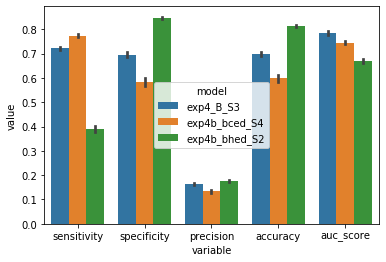

In [16]:
# Models of interest
moi = [m for m in data.model.unique() if 'B' in m or '_b' in m] #['exp4_B_S3', 'exp4b_bced_S4', 'exp4b_bhed_S2']

sns.barplot(data=data.loc[(data.model.isin(moi)) & (data.variable.isin(['sensitivity','specificity','precision','accuracy','auc_score']))],
            y='value',x='variable',hue='model')

In [19]:
import scipy
e2e = data.loc[data.model=='exp4_B_S3']
ced = data.loc[data.model=='exp4b_bced_S4']
hed = data.loc[data.model=='exp4b_bhed_S2']

for variable in ['sensitivity','specificity','precision','accuracy','auc_score']:
    x = e2e.loc[e2e['variable'] == variable].value
    y = hed.loc[hed['variable'] == variable].value
    z = ced.loc[ced['variable'] == variable].value
    _, p = scipy.stats.ttest_rel(x,y)
    print('HED -- variable: {}, p: {}'.format(variable,p))
    _, p = scipy.stats.ttest_rel(x,z)
    print('CED -- variable: {}, p: {}'.format(variable,p))     


HED -- variable: sensitivity, stats: 2.3849118089783835e-20
CED -- variable: sensitivity, stats: 8.882706155052281e-10
HED -- variable: specificity, stats: 1.3799606416468233e-16
CED -- variable: specificity, stats: 1.0321171202917898e-15
HED -- variable: precision, stats: 0.0001593675238891804
CED -- variable: precision, stats: 6.011590712931871e-19
HED -- variable: accuracy, stats: 4.263569192430697e-16
CED -- variable: accuracy, stats: 9.52850239494469e-16
HED -- variable: auc_score, stats: 9.447864155132576e-21
CED -- variable: auc_score, stats: 3.5808169114706246e-18
